<a href="https://colab.research.google.com/github/acse-moj20/msc-irp/blob/dev/PredGAN/PredGAN_3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Dev Code (PredGAN) For Fluid Problem. Version: 3**

Attempt to reduce number of epochs needed to reach loss convergence.

Specs:
- POD Coefficients: 292
- GAN Architecture 
  - generator: Modified. Additional conv2dT layer and filter size.
  - disciriminator: Modified. 2 additional conv2d layers. 
- Learning_rate: 1e-4
- ntimes: 21; steps: 1
- number generated: 5
- Batch_size: 512
- Epochs: 50,000


Setup and package import

In [1]:
%matplotlib inline
import sys
import os
import sklearn
import tensorflow as tf
from tensorflow import keras
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import joblib
import time


mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

In [2]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


# Processing Power and Available Memory

GPU Specs

In [3]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('GPU info not found.')
else:
  print(gpu_info)

print('Num of available GPUs: ', len(tf.config.list_physical_devices('GPU')))

Sat Jul  3 17:25:13 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 465.27       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P0    26W / 300W |      0MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

Memory Allocation

In [4]:
from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('You are using a high-RAM runtime!')

Your runtime has 27.3 gigabytes of available RAM



#Utility Functions

In [5]:
## UTILITY FUNCTIONS FOR VISUALIZATION AND ERROR MEASUREMENT

def calculate_error(data, data_recovered):
  abs_error = abs(data - data_recovered)
  perc_error = abs_error*100/abs(data)

  return np.max(abs_error), np.mean(abs_error)

def plot_vortex(data, times):
  fig, ax = plt.subplots(1, len(times), figsize=[20,10])
  
  for i, step in enumerate(times):
    im = ax[i].imshow(data[step], cmap='RdBu')
    ax[i].set_xlabel('X'), ax[i].set_ylabel('y')
    #ax[i].set_xticklabels([]), ax[i].set_yticklabels([])
    #ax[i].set_xticks([]), ax[i].set_yticks([])
    cbar = plt.colorbar(im, ax=ax.flatten()[i], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
    ax.flatten()[i].set_title('t = {}'.format(step), y=1.05, 
                            fontsize=16, fontweight="bold")
  plt.show()


def concat_timesteps(X_train, ntimes, step, window_start, window_end):
    X_train_concat = []
    for start, end in zip(window_start, window_end):
      for i in range(start, end+1): 
        X_train_concat.append(X_train[i:i+ntimes*step:step])
        #print('{}-{}'.format(i, i+ntimes*step) , end=', ')
      #print('\n')
    return np.array(X_train_concat)

# Model Reduction

##**Data Details**

What we know so far:


*   Dataset represents the parameter values of u, v and p for 100 separate examples of the high fidelity solution.
*   Each example is computed over 50 timesteps and a on a 256-by-256 grid.

*   Vorticity over the vector field is obatined by computing the curl of u (x-component velocity vector) and v (y-component velocity vector)






##**Raw data transformation**

**Get Data from Drive and transform**

To be run only once

In [ ]:
# data_dir = 'drive/MyDrive/MSC_IRP/data/vortex_100.npy'

# # Load x and y velocity components.
# data_file = np.load(data_dir)

# print('Size of dataset:         ', data_file.shape)
# print('Number of data samples:  ', len(data_file))
# print('Size of each sample:     ', data_file[0].shape)
# print('Number of time steps:    ', len(data_file[0]))

Size of dataset:          (100, 50, 256, 256, 3)
Number of data samples:   100
Size of each sample:      (50, 256, 256, 3)
Number of time steps:     50


In [ ]:

# # Data transformation - computing vorticity from vector field.
# # vorticity is the curl of the velocity vector field (raw dataset).

# def curl(u,v):
#   """ 
#   Function to calculate the curl of a 2-dimensional vector field.
#   Parameters:
#   -----------
#     u : 2d array of size n*m
#       vector component in the x direction.

#     v : 2d array of size n*m
#       vector component in the y direction
#   Output:
#   -------
#     curl : 2d array of size n*m
#       curl of vector field [i.e. (dv/dx)i - (du/dy)j]
#   """
#   curl = np.gradient(v)[0] - np.gradient(u)[1]
#   return curl


**Save Transformed Data to Drive**

To be run only once

In [ ]:
# Compute and save vorticity for easier data loading

# vorticity = np.zeros((100, 50, 256, 256))
# for i in range(len(data_file)):
#  for j in range(len(data_file[0])):
#    vorticity[i][j] = curl(data_file[i][j][:, :, 0], data_file[i][j][:, :, 1])
# save_dir = 'drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy'
# np.save(save_dir, vorticity)

##**Dataset visualization**

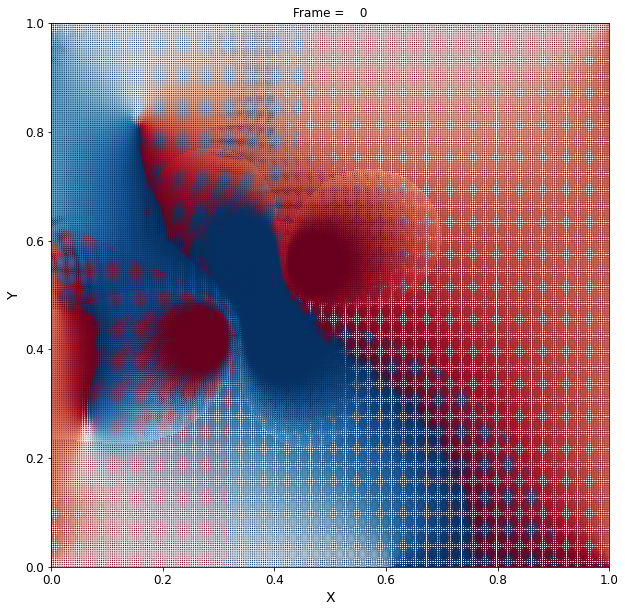

In [ ]:
import seaborn as sns
from matplotlib import animation

# # create a figure and axes
# fig, ax = plt.subplots(1,2, figsize=(12,5))

# ax[0].set_xlim((0,1))
# ax[0].set_ylim((0,1))
# ax[0].set_xlabel('X')
# ax[0].set_ylabel('Y')
# ax[0].set_title('X-Velocity vs. time')

# ax[1].set_xlim((0,1))
# ax[1].set_ylim((0,1))
# ax[1].set_xlabel('X')
# ax[1].set_ylabel('Y')
# ax[1].set_title('Y-Velocity vs. time')
# txt_title = ax[1].set_title('')
# line1 = ax[0].imshow(data[0][:, :, 0])     # ax.plot returns a list of 2D line objects
# line2 = ax[1].imshow(data[0][:, :, 1])

fig, ax= plt.subplots(figsize=(10,10))
ax.set_xlim((0,1))
ax.set_ylim((0,1))
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_title('Y-Velocity vs. time')
txt_title = ax.set_title('')

def drawframe(n):

    x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))
    plot = plt.quiver(x, y, data[n][:, :, 0], data[n][:, :, 1], 
                      np.arctan2(data[n][:, :, 0], data[n][:, :, 1]),
                      angles='xy', cmap='RdBu')
    # line1 = plt.imshow(data[n][:, :, 0])
    # line2 = plt.imshow(data[n][:, :, 1])
    txt_title.set_text('Frame = {0:4d}'.format(n))
    return (plot.U, plot.V)

txt_title.set_text('Frame = {0:4d}'.format(25))
anim = animation.FuncAnimation(fig, drawframe, frames=49, interval=200)
from IPython.display import HTML
HTML(anim.to_html5_video())

# x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))

# plt.quiver(x, y, data[10][:, :, 0], data[10][:, :, 1], np.arcsin(data[10][:, :, 0], data[10][:, :, 1],), angles='xy', scale_units='xy', scale=1,color='r')
# plt.show()

# x,y = np.meshgrid(np.linspace(0,1,256),np.linspace(0,1,256))
# plt.quiver(x, y, data[35][:, :, 0], data[35][:, :, 1], np.arcsin(data[35][:, :, 0], data[35][:, :, 1],), angles='xy', scale_units='xy', scale=1,color='r')
# plt.show()

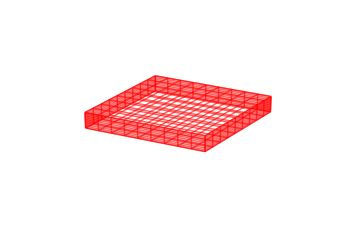

In [ ]:
# from mpl_toolkits.mplot3d import Axes3D
# import matplotlib.pyplot as plt
# import numpy as np
# from itertools import product, combinations


# fig = plt.figure()
# ax = fig.gca(projection='3d')


# # draw cube
# r = [-1, 0]
# for s, e in combinations(np.array(list(product(r, r, r))), 2):
#     if np.sum(np.abs(s-e)) == r[1]-r[0]:
#         ax.plot3D(*zip(s, e), color="b")
# r = [1, 1]
# for s, e in combinations(np.array(list(product(r, r, r))), 2):
#     if np.sum(np.abs(s-e)) == r[1]-r[0]:
#         ax.plot3D(*zip(s, e), color="b")
# # make the panes transparent
# ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
# # make the grid lines transparent
# ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
# ax.set_axis_off()
# plt.show()





# def plot_cuboid(center, size):
#     """
#        Create a data array for cuboid plotting.


#        ============= ================================================
#        Argument      Description
#        ============= ================================================
#        center        center of the cuboid, triple
#        size          size of the cuboid, triple, (x_length,y_width,z_height)
#        :type size: tuple, numpy.array, list
#        :param size: size of the cuboid, triple, (x_length,y_width,z_height)
#        :type center: tuple, numpy.array, list
#        :param center: center of the cuboid, triple, (x,y,z)
#    """
#     # suppose axis direction: x: to left; y: to inside; z: to upper
#     # get the (left, outside, bottom) point
#     import numpy as np
#     ox, oy, oz = center
#     l, w, h = size

#     x = np.linspace(ox-l/2,ox+l/2,num=10)
#     y = np.linspace(oy-w/2,oy+w/2,num=10)
#     z = np.linspace(oz-h/2,oz+h/2,num=10)
#     x1, z1 = np.meshgrid(x, z)
#     y11 = np.ones_like(x1)*(oy-w/2)
#     y12 = np.ones_like(x1)*(oy+w/2)
#     x2, y2 = np.meshgrid(x, y)
#     z21 = np.ones_like(x2)*(oz-h/2)
#     z22 = np.ones_like(x2)*(oz+h/2)
#     y3, z3 = np.meshgrid(y, z)
#     x31 = np.ones_like(y3)*(ox-l/2)
#     x32 = np.ones_like(y3)*(ox+l/2)

#     from mpl_toolkits.mplot3d import Axes3D
#     import matplotlib.pyplot as plt
#     fig = plt.figure()
#     ax = fig.gca(projection='3d')
#     # outside surface
#     ax.plot_wireframe(x1, y11, z1, color='r', rstride=1, cstride=1, alpha=0.6)
#     # inside surface
#     ax.plot_wireframe(x1, y12, z1, color='r', rstride=1, cstride=1, alpha=0.6)
#     # bottom surface
#     ax.plot_wireframe(x2, y2, z21, color='r', rstride=1, cstride=1, alpha=0.6)
#     # upper surface
#     ax.plot_wireframe(x2, y2, z22, color='r', rstride=1, cstride=1, alpha=0.6)
#     # left surface
#     ax.plot_wireframe(x31, y3, z3, color='r', rstride=1, cstride=1, alpha=0.6)
#     # right surface
#     ax.plot_wireframe(x32, y3, z3, color='r', rstride=1, cstride=1, alpha=0.6)
#     ax.set_xlabel('X')
#     ax.set_xlim(-100, 100)
#     ax.set_ylabel('Y')
#     ax.set_ylim(-100, 100)
#     ax.set_zlabel('Z')
#     ax.set_zlim(-100, 100)
#     # make the panes transparent
#     ax.xaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.yaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     ax.zaxis.set_pane_color((1.0, 1.0, 1.0, 0.0))
#     # make the grid lines transparent
#     ax.xaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.yaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.zaxis._axinfo["grid"]['color'] =  (1,1,1,0)
#     ax.set_axis_off()
#     plt.show()



# def test():
#     center = [0, 0, 0]
#     length = 50 * 3
#     width = 50 * 3
#     height = 3 * 10
#     plot_cuboid(center, (length, width, height))
# test()

##**Dimensionality reduction - PCA**

The training dataset will consist of 100 samples of a high-fidelity numerical simulation each with 50 evenly sampled snapshots (in time). Each simulation represents velocity (in x and y directions) and pressure for the turbulent flow model over a region of grid size 256x256. These values can be used to generate a vorticity field for the model. Thus, there is a total number of 256 * 256 = 65,536 variables per time step and a total of 50 * 100 = 5,000 samples. Dimensionality reduction of this high dimensional space is then performed using Principal Component Analysis (PCA) in order to work with a relatively low dimension space

###Load Data

In [ ]:
# Load vortex data as traing data.
X_train3d = np.load('drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy')

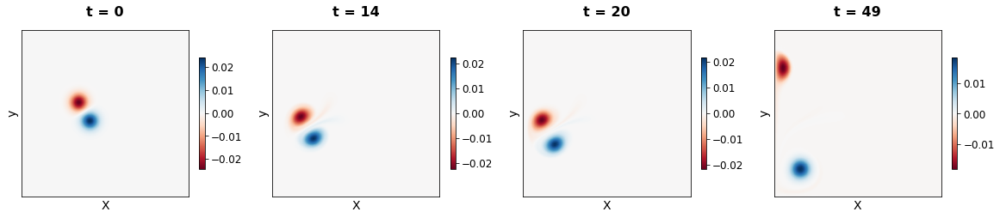

In [ ]:
times = [0, 14, 20, 49]
plot_vortex(X_train3d[58], times)

In [ ]:
nx = len(X_train3d[0][0])
timestep = len(X_train3d[0])
X_train3d.shape

(100, 50, 256, 256)

###Build PCA Model

This PCA model is built using the 292 components that gave > 99.9% variance in the reduction.

In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

normalize = False # flag to normalize training data before PCA or not.
X_train1d = X_train3d.reshape((-1, nx*nx))
print(X_train1d.shape)

# Normalization
if(normalize):
  X_train1d = StandardScaler().fit_transform(X_train1d)

# Initiate PCA
pca = PCA(X_train1d.shape[0])
X_train_pca = pca.fit_transform(X_train1d)

(5000, 65536)


KeyboardInterrupt: ignored

In [ ]:
X_recovered_1d = pca.inverse_transform(X_train_pca)
np.allclose(X_recovered_1d, X_train1d)

True

In [ ]:
p = 0.999
cumsum_eig = np.cumsum(pca.explained_variance_ratio_)
n_components_eig = np.argmax(cumsum_eig >= p) + 1 # returns the indices of the maximum values along an axis.
n_components_eig

292

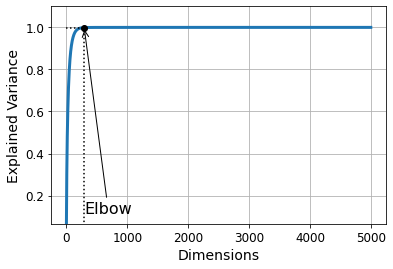

In [ ]:
plt.figure(figsize=(6,4))
plt.plot(cumsum_eig, linewidth=3)
plt.xlabel("Dimensions")
plt.ylabel("Explained Variance")
plt.ylim([cumsum_eig[0],1.1])
plt.plot([n_components_eig, n_components_eig], [0, p], "k:")
plt.plot([0, n_components_eig], [p, p], "k:")
plt.plot(n_components_eig, p, "ko")
plt.annotate("Elbow", xy=(n_components_eig, p), xytext=(n_components_eig, cumsum_eig[0]+0.05),
             arrowprops=dict(arrowstyle="->"), fontsize=16)
plt.grid(True)
plt.show()

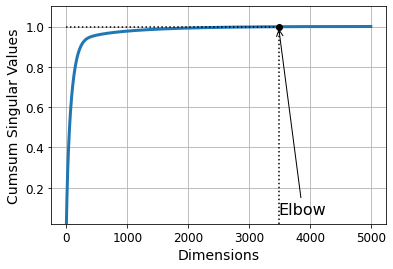

In [ ]:
p = 0.999
cumsum_sv = np.cumsum(pca.singular_values_/sum(pca.singular_values_))
n_components_sv = np.argmax(cumsum_sv >= p) + 1

d = n_components_sv
plt.figure(figsize=(6,4))
plt.plot(cumsum_sv, linewidth=3)
plt.xlabel("Dimensions")
plt.ylabel("Cumsum Singular Values")
plt.ylim([cumsum_sv[0],1.1])
plt.plot([d, d], [0, p], "k:")
plt.plot([0, d], [p, p], "k:")
plt.plot(d, p, "ko")
plt.annotate("Elbow", xy=(d, p), xytext=(d, cumsum_sv[0]+0.05),
             arrowprops=dict(arrowstyle="->"), fontsize=16)
plt.grid(True)
plt.show()
print(d)

In [ ]:
pca_rom = PCA(n_components=n_components_eig)
X_train_pca = pca_rom.fit_transform(X_train1d)
X_reconstruct = pca_rom.inverse_transform(X_train_pca)
print(X_train_pca.shape)
np.allclose(X_reconstruct, X_train1d)

(5000, 292)


False

In [ ]:
# Comparing actual data and pca reduced data
actual_data = X_train1d.reshape((-1, timestep, nx, nx))[89]
recon_data = X_reconstruct.reshape((-1, timestep, nx, nx))[89]

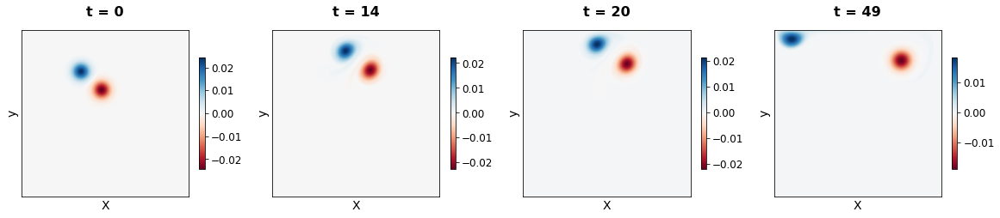

In [ ]:
plot_vortex(actual_data, times)

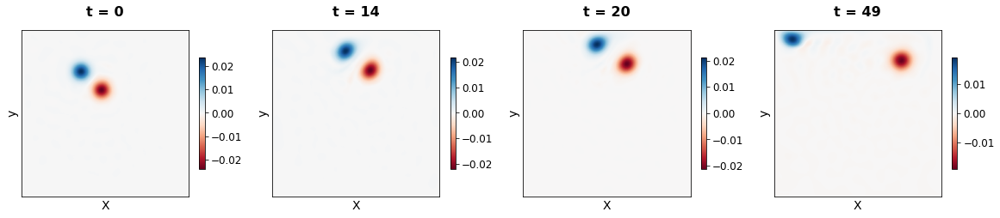

In [ ]:
plot_vortex(recon_data, times)

###Calculate Error

In [ ]:
max_abs_err, mean_abs_err = calculate_error(actual_data, recon_data)
print("Max. abs. error: {}". format(max_abs_err))
print("Mean abs. error: {}".format(mean_abs_err))

Max. abs. error: 0.0026068006677143927
Mean abs. error: 5.0103895884519914e-05


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: RuntimeWarning: divide by zero encountered in true_divide
  """


###Save PCA model

In [ ]:
import joblib
pca_file_dir = "drive/MyDrive/MSC_IRP/PredGAN/pca_rom_292.pkl"
with open(pca_file_dir, 'wb') as save_file:  
  joblib.dump(pca_rom, save_file)
#np.save('drive/MyDrive/MSC_IRP/data/pca_calc_vortex_100.npy', X_train_pca)

#Training Prediction GAN

Following reduction in dimension, we can now proceed to train a GAN for prediction.

###Load Data

In [6]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

SAVE_DIR = 'drive/MyDrive/MSC_IRP/PredGAN/'

# Load vortex data as traing data.
X_train3d = np.load('drive/MyDrive/MSC_IRP/data/calc_vortex_100.npy')
nx = len(X_train3d[0][0])
timestep = len(X_train3d[0])

print(nx)
print(timestep)

256
50


**CONFIG. SETTINGS**

In [ ]:
normalize = False # flag to normalize training data before PCA or not.
mem_load = False
num_of_coeff = 292
ntimes = 21 # Consecutive times for the GAN
step = 1 # step between times
version_num = 1

lr = 1e-4
num_examples_to_generate = 5

In [7]:

if (mem_load):
  X_train1d_pca = np.load('drive/MyDrive/MSC_IRP/data/pca_calc_vortex_100.npy')
  pca = joblib.load('drive/MyDrive/MSC_IRP/PredGAN/pca_rom_292.pkl')
else: 
  X_train1d = X_train3d.reshape((-1, nx*nx))
  # Normalization
  if (normalize):
    X_train1d = StandardScaler().fit_transform(X_train1d)
  # 
  pca = PCA(num_of_coeff)
  X_train1d_pca = pca.fit_transform(X_train1d)
  print(X_train1d_pca.shape)

(5000, 292)


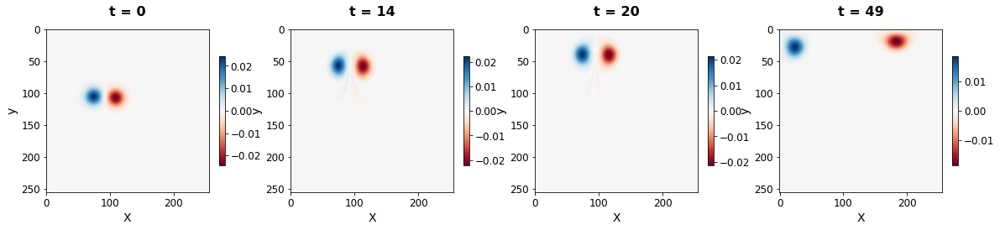

In [12]:
times = [0, 14, 20, 49]
plot_vortex(X_train3d[69], times)

(100, 50, 256, 256)


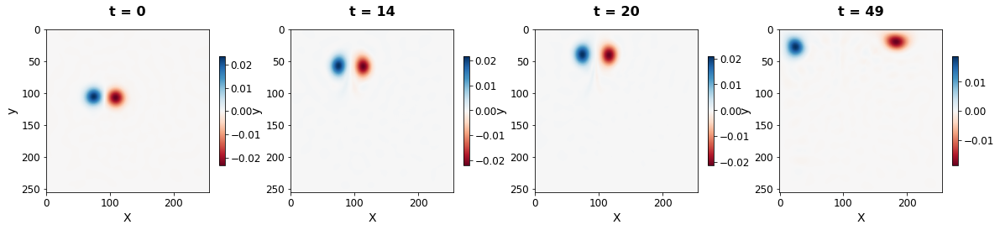

In [13]:
# Inverse PCA plots
X_recovered = pca.inverse_transform(X_train1d_pca).reshape(-1,timestep, nx, nx)
print(X_recovered.shape)
plot_vortex(X_recovered[69], times)

In [21]:
# test 1
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()
X_train1d_pca_scaled = scaler.fit_transform(X_train1d_pca)
np.allclose(X_train1d_pca, scaler.inverse_transform((X_train1d_pca_scaled)))


True

(100, 50, 256, 256)


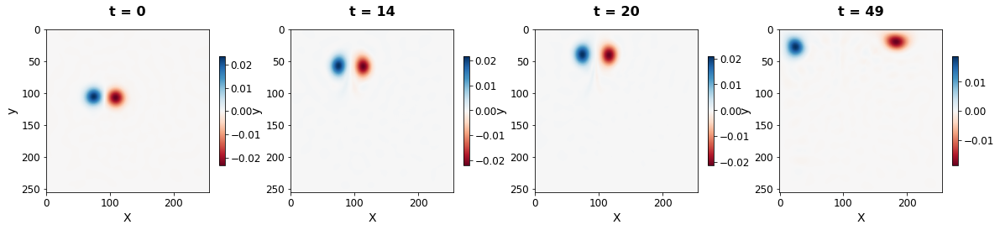

In [19]:
# Inverse scaling and inverse PCA plots
X_recovered = pca.inverse_transform(scaler.inverse_transform(X_train1d_pca_scaled)).reshape(-1,timestep, nx, nx)
print(X_recovered.shape)
plot_vortex(X_recovered[69], times)

##Train GAN

Time series Concatenation

In [23]:
sample_size = X_train3d.shape[0] #100 separate samples
window_start = [(sample*timestep)for sample in range(sample_size)]
window_end = [(sample*timestep) - (ntimes*step) for sample in range(1, sample_size + 1)]


X_train_concat = concat_timesteps(X_train1d_pca_scaled, ntimes, step, window_start, window_end)
print(X_train_concat.shape)

(3000, 21, 292)


In [30]:
def invert_data(X_data):
  X_scale_inverted = scaler.inverse_transform(X_data)
  X_pca_inverted = pca.inverse_transform(X_scale_inverted)
  return X_pca_inverted

def transform_data(X_data):
  X_pca = pca.fit_transform(X_data)
  X_pca_scaled = scaler.fit_transform(X_pca)
  return X_pca_scaled

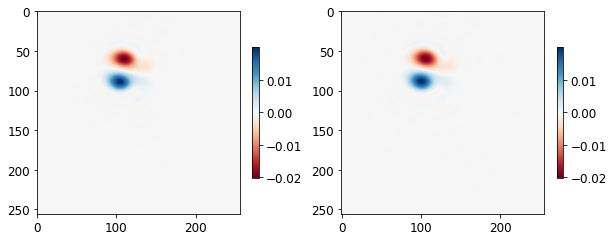

In [32]:
# Reverse transform concatenated series to check correctness
fig, ax = plt.subplots(1, 2, figsize=[10,10])
X_ = invert_data(X_train_concat[69, :, :])
im = ax[0].imshow(X_[0,:].reshape(nx, nx), cmap='RdBu')
im = ax[1].imshow(X_[1, :].reshape(nx, nx), cmap='RdBu')
fig.colorbar(im, ax=ax.flatten()[0], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
fig.colorbar(im, ax=ax.flatten()[1], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
plt.show()

In [31]:
X_.shape

(21, 65536)

Dataset Creation

In [34]:
BATCH_SIZE = 512
latent_space = 100

# Create a tensorflow dataset and split it into batches
train_dataset = X_train_concat.reshape(X_train_concat.shape[0], ntimes, num_of_coeff, 1).astype('float32')
train_dataset = tf.data.Dataset.from_tensor_slices(train_dataset)
train_dataset = train_dataset.shuffle(len(X_train_concat)).batch(BATCH_SIZE)

Generator Model

In [36]:
def make_generator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Dense(5*12*512, use_bias=False, input_shape=(latent_space,)))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Reshape((5, 12, 512)))

    model.add(keras.layers.Conv2DTranspose(256, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU()) 

    model.add(keras.layers.Conv2DTranspose(128, (3, 7), strides=(1, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Conv2DTranspose(64, (3, 7), strides=(1, 1), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Conv2DTranspose(32, (3, 7), strides=(2, 2), padding='same', use_bias=False))
    model.add(keras.layers.BatchNormalization())
    model.add(keras.layers.LeakyReLU())

    model.add(keras.layers.Conv2DTranspose(1, (3, 7), strides=(2, 3), padding ='valid', output_padding=[0,0], use_bias=False, activation='tanh'))

    return model
generator = make_generator_model()
generator.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 30720)             3072000   
_________________________________________________________________
batch_normalization_5 (Batch (None, 30720)             122880    
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 30720)             0         
_________________________________________________________________
reshape_1 (Reshape)          (None, 5, 12, 512)        0         
_________________________________________________________________
conv2d_transpose_5 (Conv2DTr (None, 5, 24, 256)        2752512   
_________________________________________________________________
batch_normalization_6 (Batch (None, 5, 24, 256)        1024      
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 5, 24, 256)       

Testing the model generator

(1, 21, 292, 1)
(21, 65536)


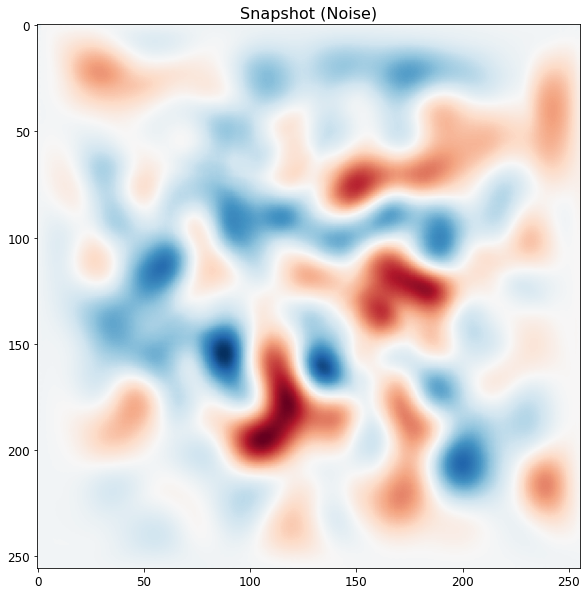

In [40]:
noise = tf.random.normal([1, 100])
generated_image = generator(noise, training=False)
print(generated_image.shape)

fig, ax = plt.subplots(figsize=[10,10])
inv_generated_image = invert_data(generated_image[0, :, :, 0])
print(inv_generated_image.shape)
ax.imshow(inv_generated_image[0, :].reshape(nx, nx), cmap='RdBu');
ax.set_title('Snapshot (Noise)', fontsize=16);

Discriminator

In [43]:
def make_discriminator_model():
    model = tf.keras.Sequential()
    model.add(keras.layers.Conv2D(64, (3, 3), strides=(2, 2), padding='same',
                                     input_shape=[ntimes, num_of_coeff, 1]))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(128, (5, 7), strides=(1, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(64, (5, 7), strides=(1, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Conv2D(32, (5, 7), strides=(1, 2), padding='same'))
    model.add(keras.layers.LeakyReLU())
    model.add(keras.layers.Dropout(0.3))

    model.add(keras.layers.Flatten())
    model.add(keras.layers.Dense(1))

    return model
discriminator = make_discriminator_model()
discriminator.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 11, 146, 64)       640       
_________________________________________________________________
leaky_re_lu_16 (LeakyReLU)   (None, 11, 146, 64)       0         
_________________________________________________________________
dropout_6 (Dropout)          (None, 11, 146, 64)       0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 11, 73, 128)       286848    
_________________________________________________________________
leaky_re_lu_17 (LeakyReLU)   (None, 11, 73, 128)       0         
_________________________________________________________________
dropout_7 (Dropout)          (None, 11, 73, 128)       0         
_________________________________________________________________
conv2d_8 (Conv2D)            (None, 11, 37, 64)       

Test disciriminator model

In [44]:
decision = discriminator(generated_image)
print(decision)

tf.Tensor([[-0.00029615]], shape=(1, 1), dtype=float32)


Generative Model


In [46]:
gan = keras.models.Sequential ([generator, discriminator])

Cost Function and Optimization

In [47]:
cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  total_loss = real_loss + fake_loss
  return total_loss

def generator_loss(fake_output):
  fake_loss = cross_entropy(tf.ones_like(fake_output), fake_output)
  return fake_loss

generator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)
discriminator_mean_loss = tf.keras.metrics.Mean(dtype=tf.float32)

# Optimizers for generator and optimizer models

generator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=lr)


In [49]:
# Seed and intitialization
num_examples_to_generate = 5
seed = tf.random.normal([num_examples_to_generate, latent_space])

# logs to document losses

generator_log_dir = SAVE_DIR + 'logs/generator_v' + str(version_num) + '_'+ str(num_of_coeff)
discriminator_log_dir = SAVE_DIR + 'logs/discriminator_v' + str(version_num) + '_'+ str(num_of_coeff)
gen_summary = tf.summary.create_file_writer(generator_log_dir)
disc_summary = tf.summary.create_file_writer(discriminator_log_dir)

Training step

In [50]:

def train_step(batch):
    noise = tf.random.normal([BATCH_SIZE, latent_space])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_images = generator(noise, training=True)
        real_output = discriminator(batch, training=True)
        fake_output = discriminator(generated_images, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
    
    generator_mean_loss(gen_loss)
    discriminator_mean_loss(disc_loss)

Training loop

In [54]:
def train(dataset, epochs):
    hist = []
    for epoch in range(epochs+1):
        start = time.time()
        print("Epoch {}/{}".format(epoch + 1, epochs))   

        for batch in dataset:
            train_step(batch)
            
        with gen_summary.as_default():
            tf.summary.scalar('loss', generator_mean_loss.result(), step=epoch)

        with disc_summary.as_default():
            tf.summary.scalar('loss', discriminator_mean_loss.result(), step=epoch)
        
        hist.append([generator_mean_loss.result().numpy(), discriminator_mean_loss.result().numpy()])

        generator_mean_loss.reset_states()
        discriminator_mean_loss.reset_states()
        print("discriminator loss: ", "{:.6f}".format(hist[-1][1]), end=' - ')
        print("generator loss: ", "{:.6f}".format(hist[-1][0]), end=' - ')    
        print ('{:.0f}s'.format( time.time()-start))

        pred_time_len = 3
        # Global variables are used below
        if epoch%1000 == 0: 
            # Plot generated data
            X_generated = generator.predict(seed).reshape(-1, num_of_coeff)
            X_generated = invert_data(X_generated)
            print(X_generated.shape)
            X_generated = X_generated.reshape(num_examples_to_generate, ntimes, nx*nx)
            fig, ax = plt.subplots(pred_time_len, num_examples_to_generate, figsize=[20, 20])
            for j in range(num_examples_to_generate):
              for i in range(pred_time_len):
                im = ax[i,j].imshow(X_generated[j].reshape(ntimes, nx, nx)[i,:,:], cmap='RdBu')
                fig.colorbar(im, ax=ax[i,j], shrink=0.24, pad=0.05, panchor=(0.0, 0.0))
                ax[i,j].set_xticklabels([]), ax[i,j].set_yticklabels([])
            plt.tight_layout(pad=0)
            plt.show() 
                    
            # Save model
            # gan.save(SAVE_DIR + 'ganmodels/'+str(epoch)+'.h5')    
            gan.save(SAVE_DIR + 'ganmodels/model_v'+ str(version_num) + '_'+ 
                                        str(num_of_coeff)+'_'+str(epoch)+'.h5')  
            # plot loss
            print('Loss: ')
            fig, ax = plt.subplots(1,1, figsize=[20,10])
            ax.plot(hist)
            ax.legend(['loss_gen', 'loss_disc'])
            ax.set_yscale('log')
            ax.grid()
            plt.show()
            
    return hist


Epoch 1/50000
discriminator loss:  0.185306 - generator loss:  4.614553 - 3s
(105, 65536)


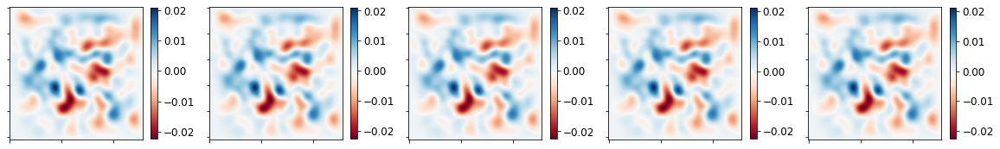

Loss: 


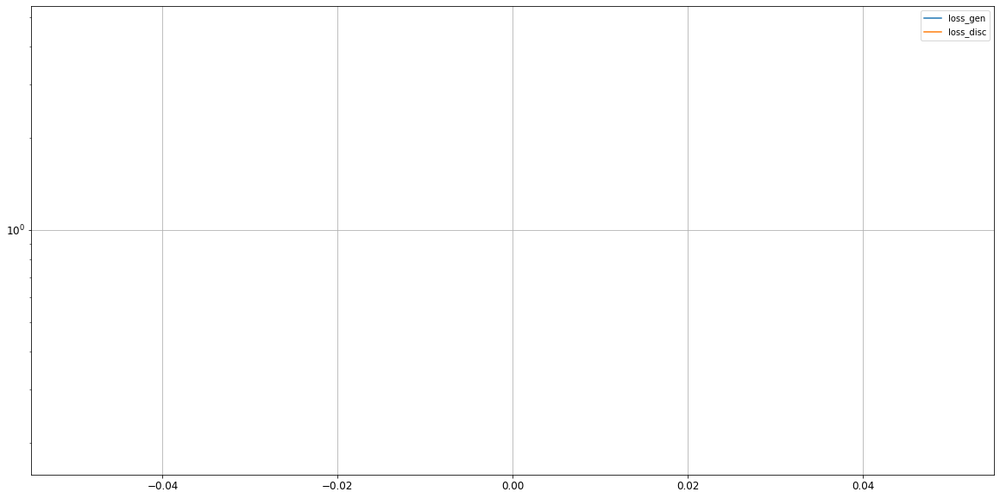

Epoch 2/50000
discriminator loss:  0.159138 - generator loss:  3.662189 - 3s
Epoch 3/50000
discriminator loss:  0.275339 - generator loss:  2.927832 - 3s
Epoch 4/50000
discriminator loss:  0.428255 - generator loss:  2.714808 - 3s
Epoch 5/50000
discriminator loss:  0.519875 - generator loss:  2.058645 - 3s
Epoch 6/50000
discriminator loss:  0.529380 - generator loss:  2.277532 - 3s
Epoch 7/50000
discriminator loss:  0.788948 - generator loss:  1.910715 - 3s
Epoch 8/50000
discriminator loss:  1.042275 - generator loss:  1.577153 - 3s
Epoch 9/50000
discriminator loss:  1.171824 - generator loss:  1.445960 - 3s
Epoch 10/50000
discriminator loss:  0.686171 - generator loss:  1.550732 - 3s
Epoch 11/50000
discriminator loss:  1.061876 - generator loss:  1.224560 - 3s
Epoch 12/50000
discriminator loss:  2.669828 - generator loss:  0.451589 - 3s
Epoch 13/50000
discriminator loss:  0.823281 - generator loss:  1.339863 - 3s
Epoch 14/50000
discriminator loss:  0.446784 - generator loss:  1.776442

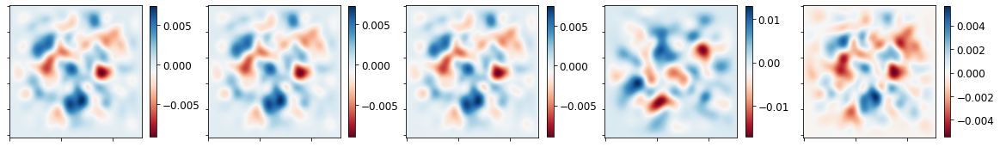

Loss: 


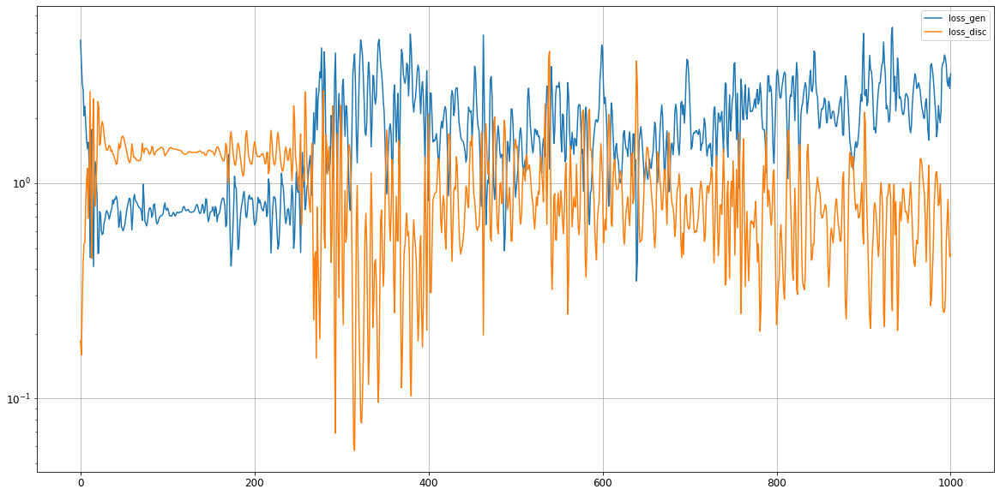

Epoch 1002/50000
discriminator loss:  0.517524 - generator loss:  2.729212 - 3s
Epoch 1003/50000
discriminator loss:  0.762251 - generator loss:  2.167324 - 3s
Epoch 1004/50000
discriminator loss:  1.422105 - generator loss:  1.575171 - 3s
Epoch 1005/50000
discriminator loss:  1.387270 - generator loss:  1.145478 - 3s
Epoch 1006/50000
discriminator loss:  0.949136 - generator loss:  2.054324 - 3s
Epoch 1007/50000
discriminator loss:  0.500729 - generator loss:  2.273251 - 3s
Epoch 1008/50000
discriminator loss:  0.342480 - generator loss:  2.755438 - 3s
Epoch 1009/50000
discriminator loss:  0.301926 - generator loss:  3.133443 - 3s
Epoch 1010/50000
discriminator loss:  0.306124 - generator loss:  2.841082 - 3s
Epoch 1011/50000
discriminator loss:  0.317847 - generator loss:  3.295835 - 3s
Epoch 1012/50000
discriminator loss:  0.351745 - generator loss:  3.770435 - 3s
Epoch 1013/50000
discriminator loss:  0.422083 - generator loss:  4.222598 - 3s
Epoch 1014/50000
discriminator loss:  0.

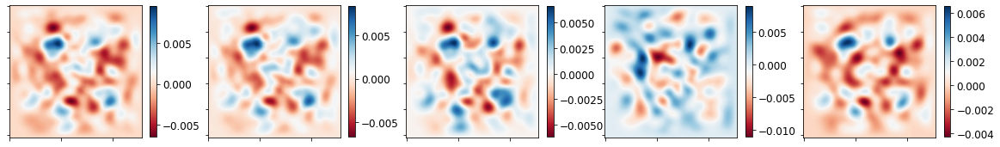

Loss: 


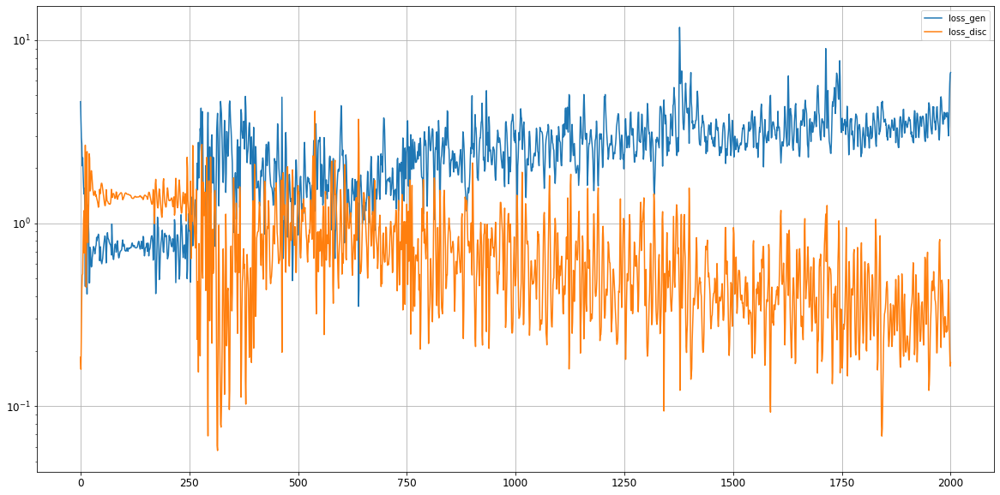

Epoch 2002/50000
discriminator loss:  0.214345 - generator loss:  5.506025 - 3s
Epoch 2003/50000
discriminator loss:  0.349718 - generator loss:  4.451333 - 3s
Epoch 2004/50000
discriminator loss:  0.518616 - generator loss:  3.880387 - 3s
Epoch 2005/50000
discriminator loss:  0.945739 - generator loss:  4.451207 - 3s
Epoch 2006/50000
discriminator loss:  0.362160 - generator loss:  4.986604 - 3s
Epoch 2007/50000
discriminator loss:  0.215381 - generator loss:  5.770463 - 3s
Epoch 2008/50000
discriminator loss:  0.153862 - generator loss:  6.279179 - 3s
Epoch 2009/50000
discriminator loss:  0.168015 - generator loss:  6.686922 - 3s
Epoch 2010/50000
discriminator loss:  0.240354 - generator loss:  6.996450 - 3s
Epoch 2011/50000
discriminator loss:  0.387459 - generator loss:  7.326246 - 3s
Epoch 2012/50000
discriminator loss:  0.532794 - generator loss:  6.918795 - 3s
Epoch 2013/50000
discriminator loss:  0.497587 - generator loss:  6.534327 - 3s
Epoch 2014/50000
discriminator loss:  0.

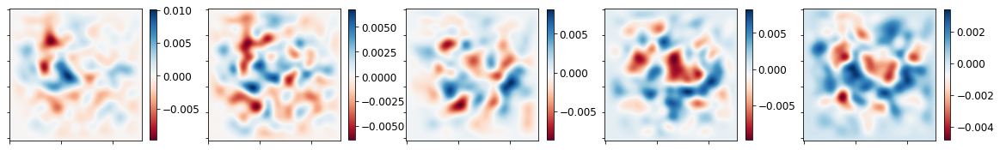

Loss: 


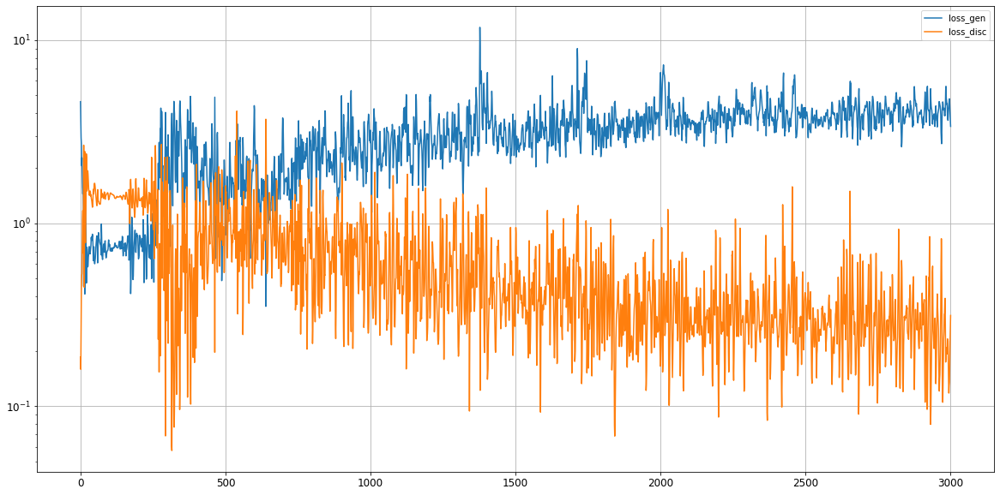

Epoch 3002/50000
discriminator loss:  0.312432 - generator loss:  3.654087 - 3s
Epoch 3003/50000
discriminator loss:  0.255796 - generator loss:  3.693549 - 3s
Epoch 3004/50000
discriminator loss:  0.235044 - generator loss:  3.879970 - 3s
Epoch 3005/50000
discriminator loss:  0.225469 - generator loss:  4.093269 - 3s
Epoch 3006/50000
discriminator loss:  0.179113 - generator loss:  4.424005 - 3s
Epoch 3007/50000
discriminator loss:  0.213254 - generator loss:  4.512581 - 3s
Epoch 3008/50000
discriminator loss:  0.314124 - generator loss:  4.502453 - 3s
Epoch 3009/50000
discriminator loss:  0.430798 - generator loss:  4.351785 - 3s
Epoch 3010/50000
discriminator loss:  0.448497 - generator loss:  4.723478 - 3s
Epoch 3011/50000
discriminator loss:  0.340575 - generator loss:  4.765167 - 3s
Epoch 3012/50000
discriminator loss:  0.236426 - generator loss:  5.067238 - 3s
Epoch 3013/50000
discriminator loss:  0.295042 - generator loss:  4.817625 - 3s
Epoch 3014/50000
discriminator loss:  0.

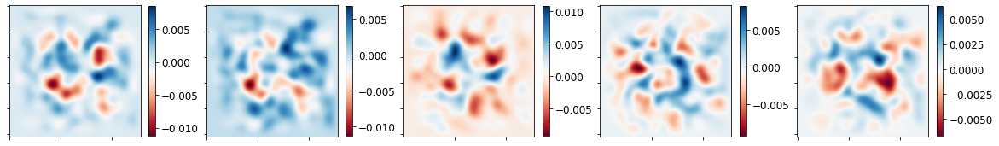

Loss: 


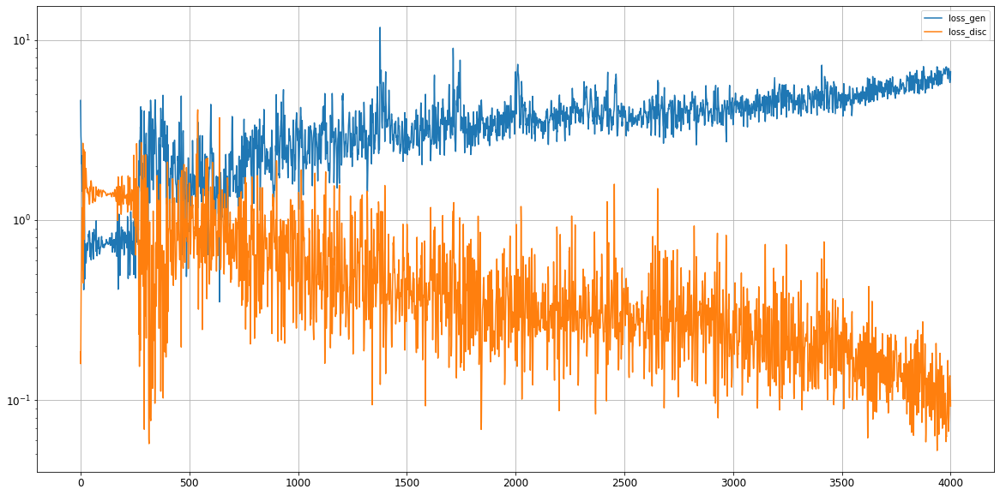

Epoch 4002/50000
discriminator loss:  0.081461 - generator loss:  6.858854 - 3s
Epoch 4003/50000
discriminator loss:  0.062635 - generator loss:  7.027889 - 3s
Epoch 4004/50000
discriminator loss:  0.095172 - generator loss:  6.470048 - 3s
Epoch 4005/50000
discriminator loss:  0.136113 - generator loss:  6.305021 - 3s
Epoch 4006/50000
discriminator loss:  0.166430 - generator loss:  5.666078 - 3s
Epoch 4007/50000
discriminator loss:  0.147023 - generator loss:  5.868822 - 3s
Epoch 4008/50000
discriminator loss:  0.119471 - generator loss:  6.112856 - 3s
Epoch 4009/50000
discriminator loss:  0.086246 - generator loss:  6.427022 - 3s
Epoch 4010/50000
discriminator loss:  0.063080 - generator loss:  6.946033 - 3s
Epoch 4011/50000
discriminator loss:  0.079450 - generator loss:  6.603111 - 3s
Epoch 4012/50000
discriminator loss:  0.092483 - generator loss:  6.566469 - 3s
Epoch 4013/50000
discriminator loss:  0.125927 - generator loss:  6.213465 - 3s
Epoch 4014/50000
discriminator loss:  0.

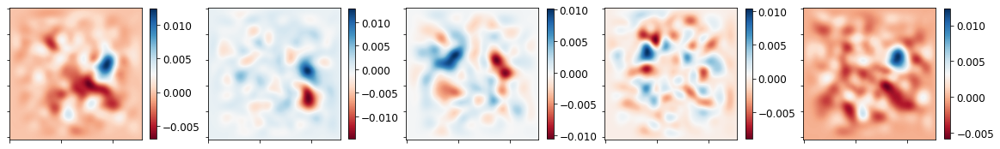

Loss: 


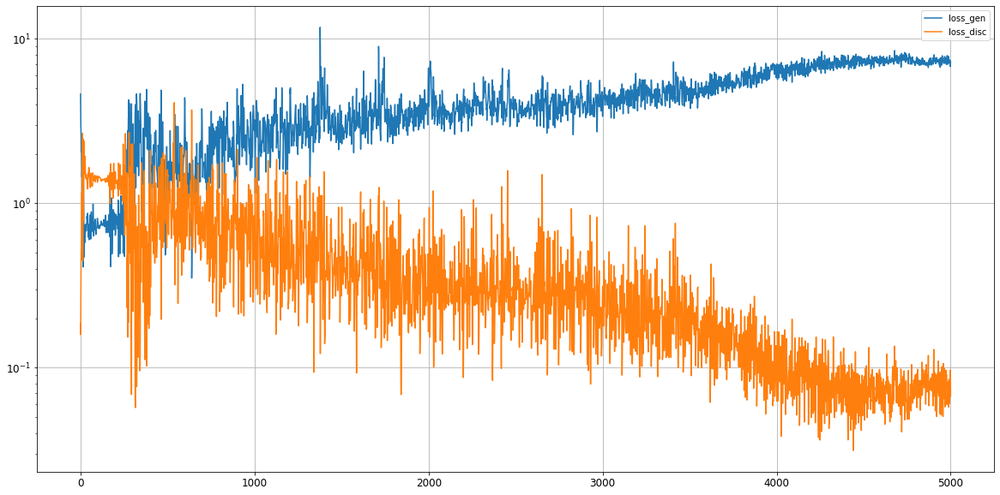

Epoch 5002/50000
discriminator loss:  0.069857 - generator loss:  7.578234 - 3s
Epoch 5003/50000
discriminator loss:  0.064108 - generator loss:  7.368710 - 3s
Epoch 5004/50000
discriminator loss:  0.082155 - generator loss:  7.340166 - 3s
Epoch 5005/50000
discriminator loss:  0.093328 - generator loss:  7.398711 - 3s
Epoch 5006/50000
discriminator loss:  0.070267 - generator loss:  7.632103 - 3s
Epoch 5007/50000
discriminator loss:  0.074715 - generator loss:  7.513086 - 3s
Epoch 5008/50000
discriminator loss:  0.080075 - generator loss:  7.423924 - 3s
Epoch 5009/50000
discriminator loss:  0.074203 - generator loss:  7.469488 - 3s
Epoch 5010/50000
discriminator loss:  0.103442 - generator loss:  7.501291 - 3s
Epoch 5011/50000
discriminator loss:  0.094299 - generator loss:  7.453999 - 3s
Epoch 5012/50000
discriminator loss:  0.063785 - generator loss:  7.569666 - 3s
Epoch 5013/50000
discriminator loss:  0.059062 - generator loss:  7.673771 - 3s
Epoch 5014/50000
discriminator loss:  0.

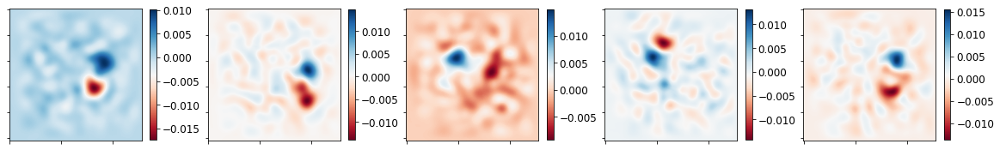

Loss: 


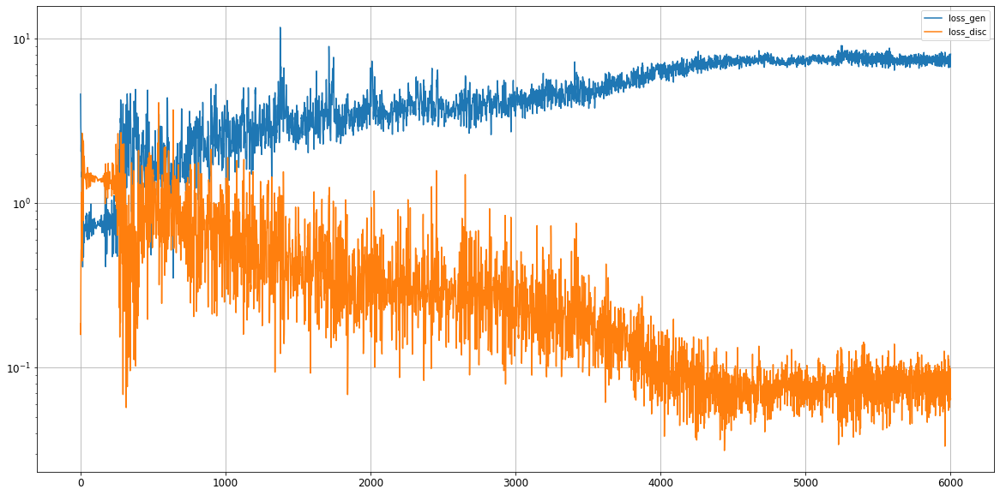

Epoch 6002/50000
discriminator loss:  0.088151 - generator loss:  7.436188 - 3s
Epoch 6003/50000
discriminator loss:  0.096026 - generator loss:  6.913221 - 3s
Epoch 6004/50000
discriminator loss:  0.064955 - generator loss:  7.980970 - 3s
Epoch 6005/50000
discriminator loss:  0.043929 - generator loss:  7.857235 - 3s
Epoch 6006/50000
discriminator loss:  0.071321 - generator loss:  7.614606 - 3s
Epoch 6007/50000
discriminator loss:  0.111382 - generator loss:  7.380661 - 3s
Epoch 6008/50000
discriminator loss:  0.117040 - generator loss:  6.676908 - 3s
Epoch 6009/50000
discriminator loss:  0.069887 - generator loss:  7.781535 - 3s
Epoch 6010/50000
discriminator loss:  0.059395 - generator loss:  7.985686 - 3s
Epoch 6011/50000
discriminator loss:  0.092255 - generator loss:  7.490154 - 3s
Epoch 6012/50000
discriminator loss:  0.097129 - generator loss:  7.430888 - 3s
Epoch 6013/50000
discriminator loss:  0.086055 - generator loss:  7.326077 - 3s
Epoch 6014/50000
discriminator loss:  0.

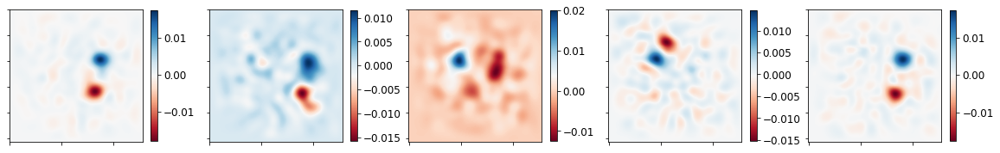

Loss: 


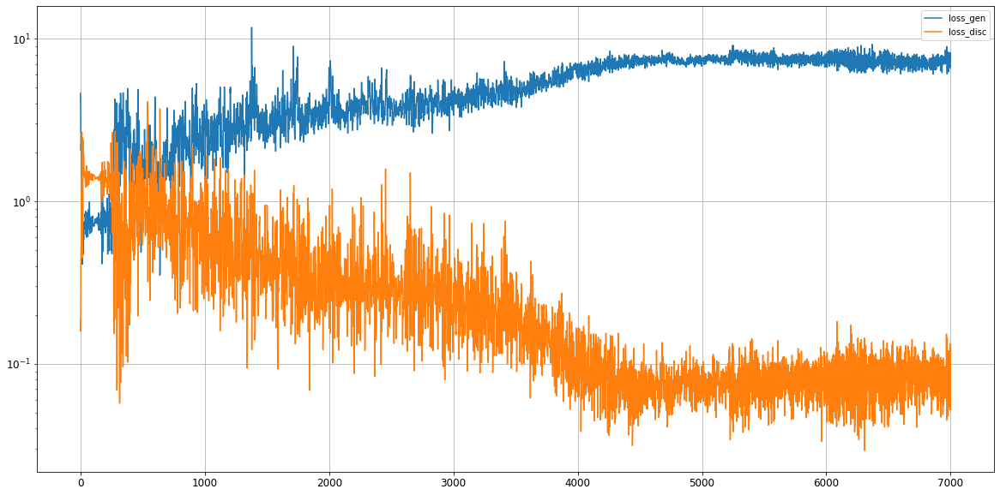

Epoch 7002/50000
discriminator loss:  0.079913 - generator loss:  6.988924 - 3s
Epoch 7003/50000
discriminator loss:  0.115023 - generator loss:  6.385088 - 3s
Epoch 7004/50000
discriminator loss:  0.117311 - generator loss:  6.555672 - 3s
Epoch 7005/50000
discriminator loss:  0.064609 - generator loss:  7.776549 - 3s
Epoch 7006/50000
discriminator loss:  0.059171 - generator loss:  7.970255 - 3s
Epoch 7007/50000
discriminator loss:  0.096610 - generator loss:  7.376513 - 3s
Epoch 7008/50000
discriminator loss:  0.145806 - generator loss:  7.212883 - 3s
Epoch 7009/50000
discriminator loss:  0.097297 - generator loss:  7.245718 - 3s
Epoch 7010/50000
discriminator loss:  0.063970 - generator loss:  8.193954 - 3s
Epoch 7011/50000
discriminator loss:  0.058902 - generator loss:  7.657001 - 3s
Epoch 7012/50000
discriminator loss:  0.102278 - generator loss:  6.822632 - 3s
Epoch 7013/50000
discriminator loss:  0.118079 - generator loss:  6.232095 - 3s
Epoch 7014/50000
discriminator loss:  0.

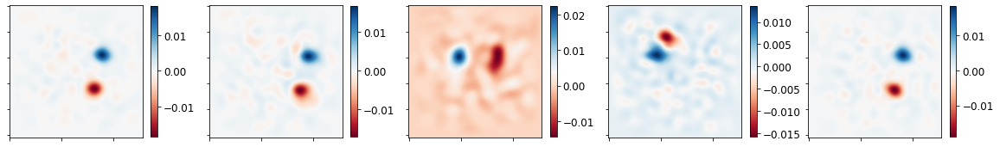

Loss: 


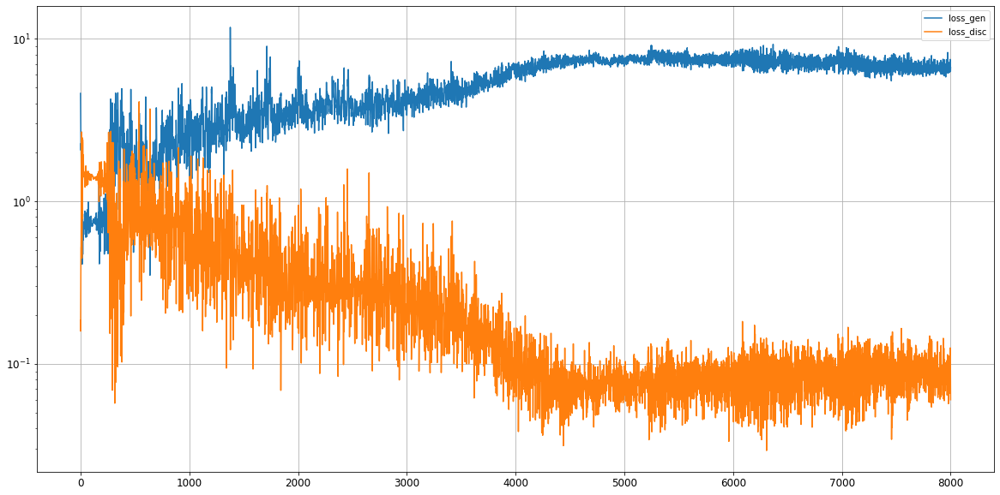

Epoch 8002/50000
discriminator loss:  0.050378 - generator loss:  6.863707 - 3s
Epoch 8003/50000
discriminator loss:  0.106030 - generator loss:  6.147052 - 3s
Epoch 8004/50000
discriminator loss:  0.132485 - generator loss:  6.118090 - 3s
Epoch 8005/50000
discriminator loss:  0.094291 - generator loss:  6.542010 - 3s
Epoch 8006/50000
discriminator loss:  0.074329 - generator loss:  7.842164 - 3s
Epoch 8007/50000
discriminator loss:  0.072013 - generator loss:  7.708256 - 3s
Epoch 8008/50000
discriminator loss:  0.065305 - generator loss:  7.178956 - 3s
Epoch 8009/50000
discriminator loss:  0.102735 - generator loss:  6.287098 - 3s
Epoch 8010/50000
discriminator loss:  0.111628 - generator loss:  5.974791 - 3s
Epoch 8011/50000
discriminator loss:  0.095385 - generator loss:  6.150844 - 3s
Epoch 8012/50000
discriminator loss:  0.076145 - generator loss:  6.370914 - 3s
Epoch 8013/50000
discriminator loss:  0.080417 - generator loss:  6.469961 - 3s
Epoch 8014/50000
discriminator loss:  0.

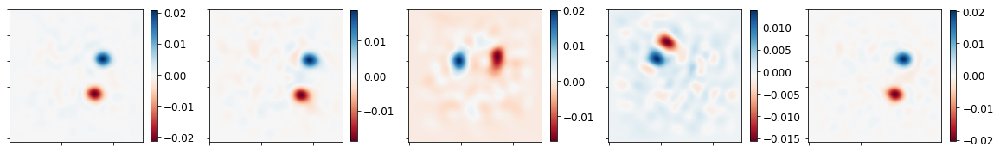

Loss: 


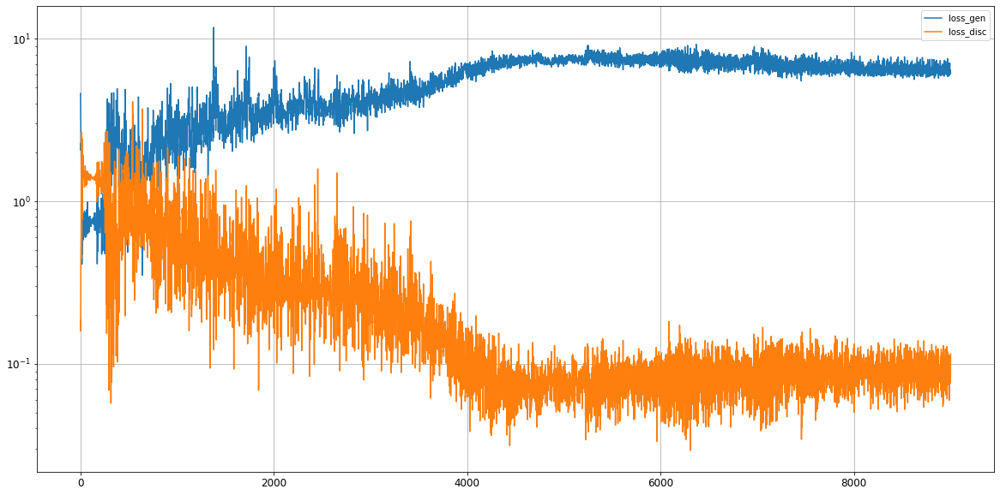

Epoch 9002/50000
discriminator loss:  0.109921 - generator loss:  6.404324 - 3s
Epoch 9003/50000
discriminator loss:  0.094805 - generator loss:  6.575943 - 3s
Epoch 9004/50000
discriminator loss:  0.085157 - generator loss:  6.682410 - 3s
Epoch 9005/50000
discriminator loss:  0.092081 - generator loss:  6.864275 - 3s
Epoch 9006/50000
discriminator loss:  0.105313 - generator loss:  6.400400 - 3s
Epoch 9007/50000
discriminator loss:  0.091739 - generator loss:  6.300407 - 3s
Epoch 9008/50000
discriminator loss:  0.101204 - generator loss:  6.212084 - 5s
Epoch 9009/50000
discriminator loss:  0.099640 - generator loss:  5.854698 - 3s
Epoch 9010/50000
discriminator loss:  0.098867 - generator loss:  6.070916 - 3s
Epoch 9011/50000
discriminator loss:  0.087823 - generator loss:  6.215604 - 3s
Epoch 9012/50000
discriminator loss:  0.084727 - generator loss:  6.595481 - 3s
Epoch 9013/50000
discriminator loss:  0.090081 - generator loss:  6.590604 - 3s
Epoch 9014/50000
discriminator loss:  0.

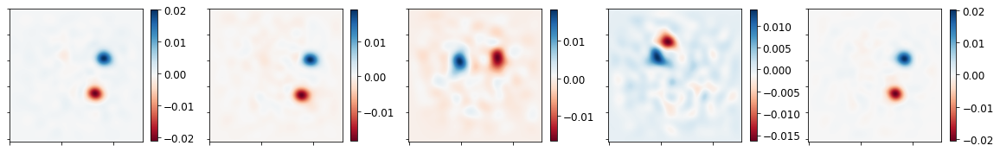

Loss: 


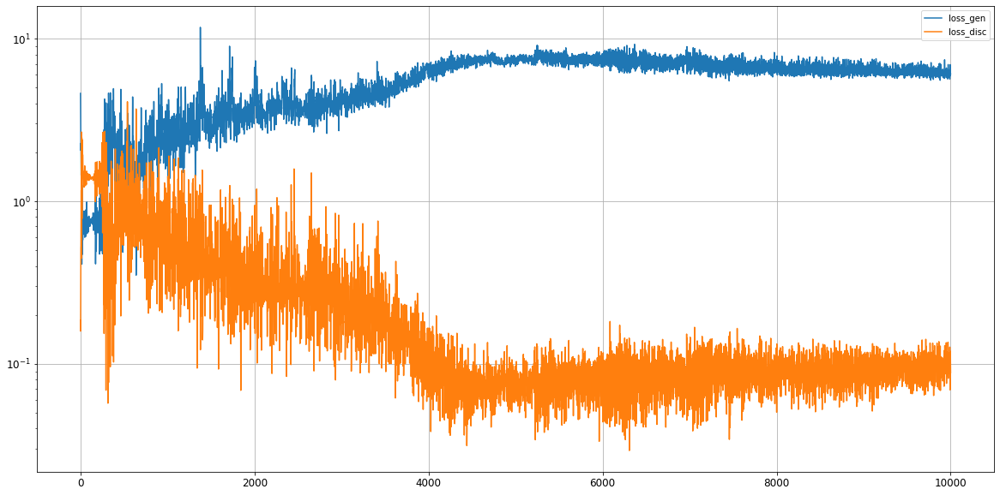

Epoch 10002/50000
discriminator loss:  0.099717 - generator loss:  6.027889 - 3s
Epoch 10003/50000
discriminator loss:  0.106026 - generator loss:  6.143979 - 3s
Epoch 10004/50000
discriminator loss:  0.094106 - generator loss:  6.417156 - 3s
Epoch 10005/50000
discriminator loss:  0.095830 - generator loss:  6.474204 - 3s
Epoch 10006/50000
discriminator loss:  0.084236 - generator loss:  6.689787 - 3s
Epoch 10007/50000
discriminator loss:  0.103661 - generator loss:  5.999944 - 3s
Epoch 10008/50000
discriminator loss:  0.105575 - generator loss:  5.768023 - 3s
Epoch 10009/50000
discriminator loss:  0.111974 - generator loss:  5.960515 - 3s
Epoch 10010/50000
discriminator loss:  0.073129 - generator loss:  6.277239 - 3s
Epoch 10011/50000
discriminator loss:  0.073690 - generator loss:  6.110878 - 3s
Epoch 10012/50000
discriminator loss:  0.121561 - generator loss:  5.775356 - 3s
Epoch 10013/50000
discriminator loss:  0.135937 - generator loss:  5.820442 - 3s
Epoch 10014/50000
discrimina

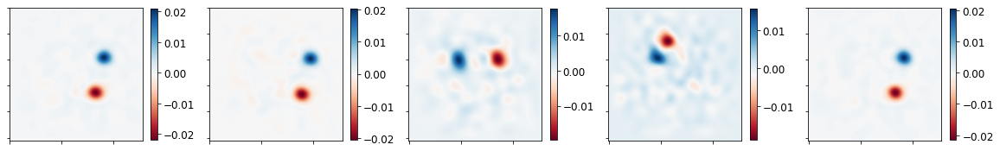

Loss: 


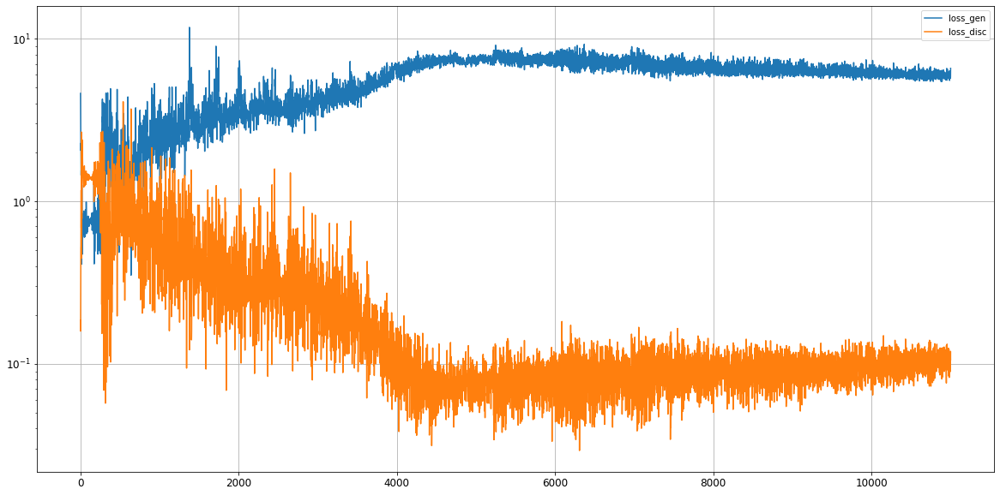

Epoch 11002/50000
discriminator loss:  0.106373 - generator loss:  6.266092 - 3s
Epoch 11003/50000
discriminator loss:  0.095488 - generator loss:  6.063259 - 3s
Epoch 11004/50000
discriminator loss:  0.112988 - generator loss:  6.079140 - 3s
Epoch 11005/50000
discriminator loss:  0.114229 - generator loss:  5.712832 - 3s
Epoch 11006/50000
discriminator loss:  0.109475 - generator loss:  5.582273 - 3s
Epoch 11007/50000
discriminator loss:  0.086410 - generator loss:  5.846249 - 3s
Epoch 11008/50000
discriminator loss:  0.086075 - generator loss:  5.830402 - 3s
Epoch 11009/50000
discriminator loss:  0.090048 - generator loss:  5.802513 - 3s
Epoch 11010/50000
discriminator loss:  0.110262 - generator loss:  5.866346 - 3s
Epoch 11011/50000
discriminator loss:  0.107729 - generator loss:  6.122234 - 3s
Epoch 11012/50000
discriminator loss:  0.102259 - generator loss:  6.266185 - 3s
Epoch 11013/50000
discriminator loss:  0.093485 - generator loss:  5.946525 - 3s
Epoch 11014/50000
discrimina

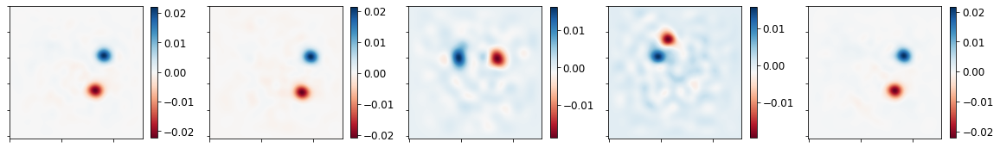

Loss: 


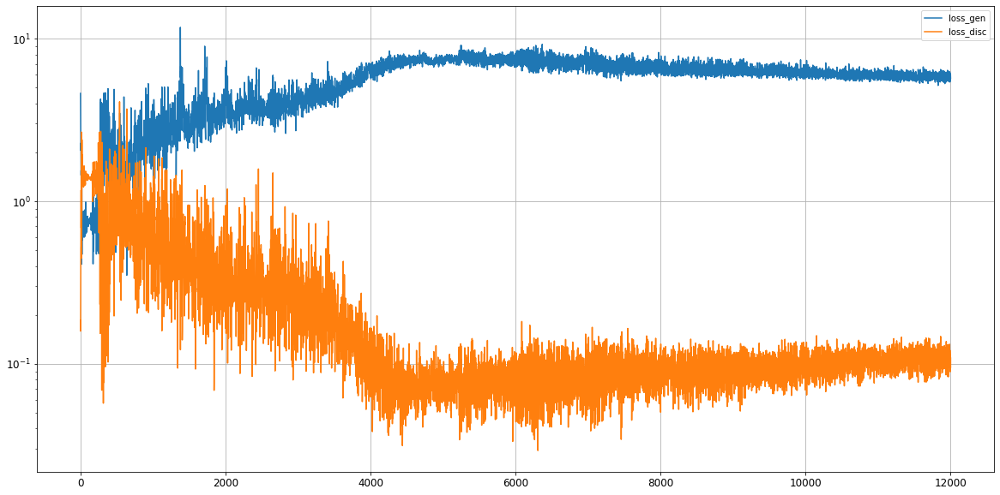

Epoch 12002/50000
discriminator loss:  0.093577 - generator loss:  5.734408 - 3s
Epoch 12003/50000
discriminator loss:  0.114594 - generator loss:  5.633045 - 3s
Epoch 12004/50000
discriminator loss:  0.113536 - generator loss:  5.642529 - 3s
Epoch 12005/50000
discriminator loss:  0.105696 - generator loss:  5.585106 - 3s
Epoch 12006/50000
discriminator loss:  0.117614 - generator loss:  5.882434 - 3s
Epoch 12007/50000
discriminator loss:  0.125306 - generator loss:  5.877100 - 3s
Epoch 12008/50000
discriminator loss:  0.104096 - generator loss:  5.701321 - 3s
Epoch 12009/50000
discriminator loss:  0.092770 - generator loss:  6.135012 - 3s
Epoch 12010/50000
discriminator loss:  0.094177 - generator loss:  5.966426 - 3s
Epoch 12011/50000
discriminator loss:  0.102151 - generator loss:  5.731624 - 3s
Epoch 12012/50000
discriminator loss:  0.120622 - generator loss:  5.498707 - 3s
Epoch 12013/50000
discriminator loss:  0.131294 - generator loss:  5.428305 - 3s
Epoch 12014/50000
discrimina

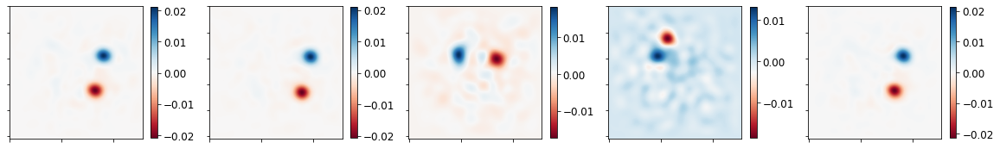

Loss: 


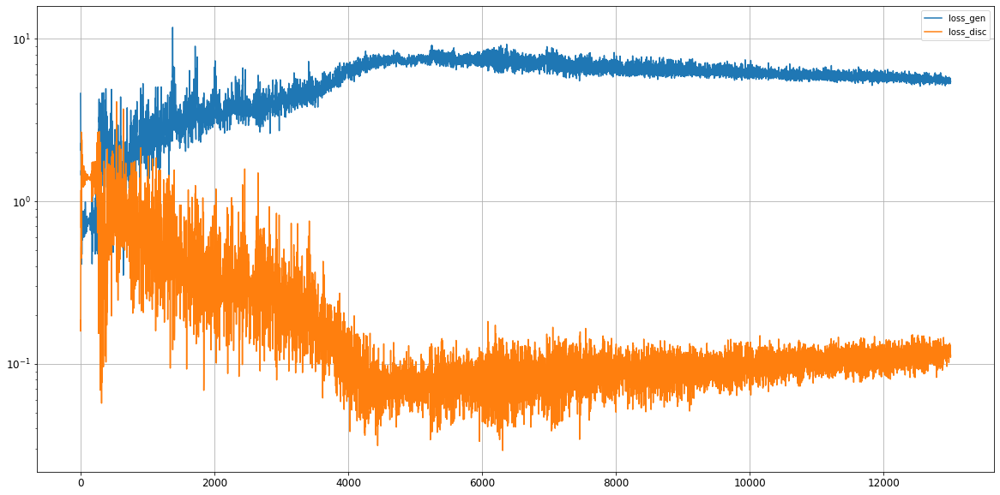

Epoch 13002/50000
discriminator loss:  0.122044 - generator loss:  5.455765 - 3s
Epoch 13003/50000
discriminator loss:  0.119302 - generator loss:  5.361217 - 3s
Epoch 13004/50000
discriminator loss:  0.112118 - generator loss:  5.154256 - 3s
Epoch 13005/50000
discriminator loss:  0.115919 - generator loss:  5.428375 - 3s
Epoch 13006/50000
discriminator loss:  0.127282 - generator loss:  5.793205 - 3s
Epoch 13007/50000
discriminator loss:  0.111701 - generator loss:  5.537952 - 3s
Epoch 13008/50000
discriminator loss:  0.118896 - generator loss:  5.656029 - 3s
Epoch 13009/50000
discriminator loss:  0.123676 - generator loss:  5.432901 - 3s
Epoch 13010/50000
discriminator loss:  0.115371 - generator loss:  5.462640 - 3s
Epoch 13011/50000
discriminator loss:  0.113658 - generator loss:  5.259763 - 3s
Epoch 13012/50000
discriminator loss:  0.115085 - generator loss:  5.233469 - 3s
Epoch 13013/50000
discriminator loss:  0.124335 - generator loss:  5.448955 - 3s
Epoch 13014/50000
discrimina

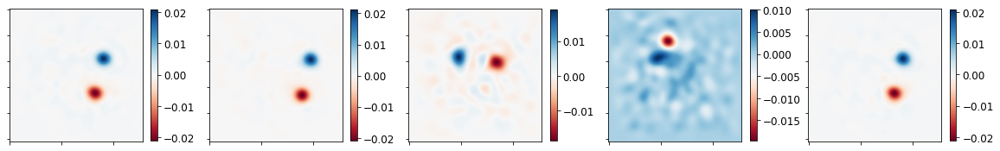

Loss: 


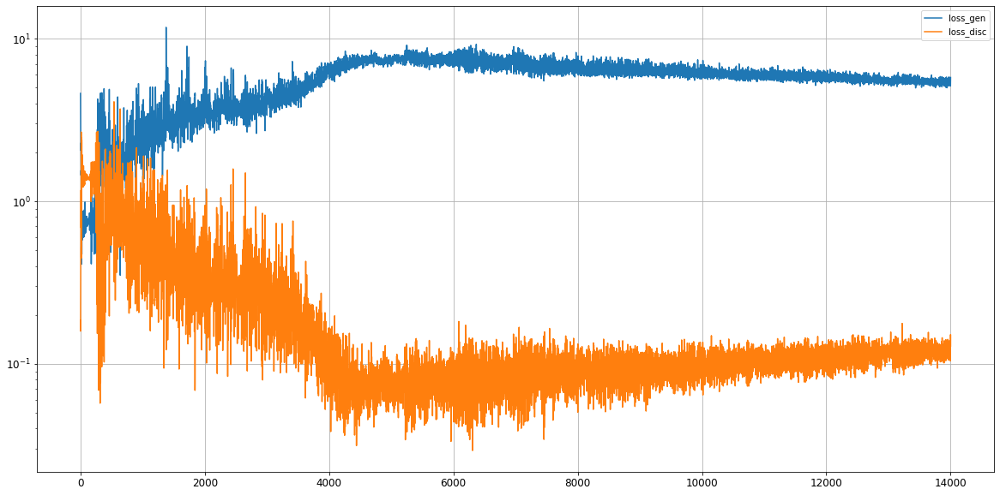

Epoch 14002/50000
discriminator loss:  0.108655 - generator loss:  5.666899 - 3s
Epoch 14003/50000
discriminator loss:  0.115934 - generator loss:  5.361791 - 3s
Epoch 14004/50000
discriminator loss:  0.128359 - generator loss:  5.246213 - 3s
Epoch 14005/50000
discriminator loss:  0.114498 - generator loss:  5.350159 - 3s
Epoch 14006/50000
discriminator loss:  0.120710 - generator loss:  5.399204 - 3s
Epoch 14007/50000
discriminator loss:  0.119876 - generator loss:  5.323905 - 3s
Epoch 14008/50000
discriminator loss:  0.121757 - generator loss:  5.057057 - 3s
Epoch 14009/50000
discriminator loss:  0.116395 - generator loss:  5.497199 - 3s
Epoch 14010/50000
discriminator loss:  0.110205 - generator loss:  5.443140 - 3s
Epoch 14011/50000
discriminator loss:  0.117602 - generator loss:  5.197480 - 3s
Epoch 14012/50000
discriminator loss:  0.120458 - generator loss:  5.287055 - 3s
Epoch 14013/50000
discriminator loss:  0.127279 - generator loss:  5.448943 - 3s
Epoch 14014/50000
discrimina

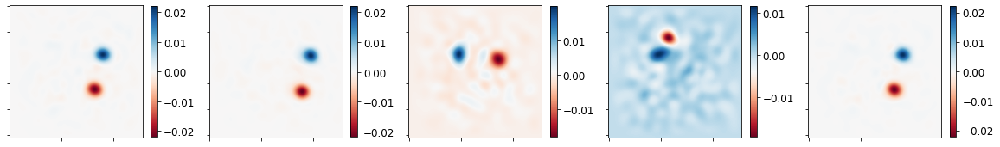

Loss: 


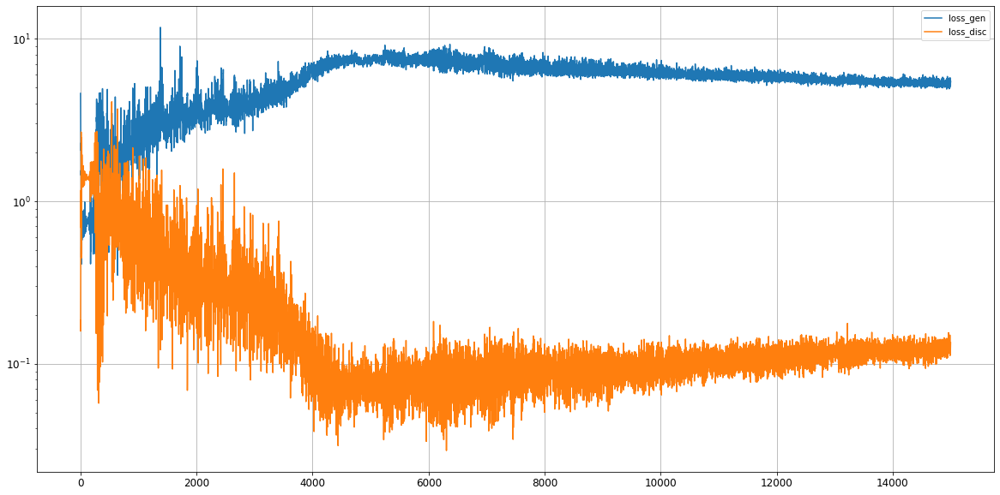

Epoch 15002/50000
discriminator loss:  0.119892 - generator loss:  5.188432 - 3s
Epoch 15003/50000
discriminator loss:  0.128112 - generator loss:  5.364231 - 3s
Epoch 15004/50000
discriminator loss:  0.133945 - generator loss:  5.173081 - 3s
Epoch 15005/50000
discriminator loss:  0.115024 - generator loss:  5.283902 - 3s
Epoch 15006/50000
discriminator loss:  0.116108 - generator loss:  5.112124 - 3s
Epoch 15007/50000
discriminator loss:  0.126281 - generator loss:  5.119693 - 3s
Epoch 15008/50000
discriminator loss:  0.120720 - generator loss:  5.401393 - 3s
Epoch 15009/50000
discriminator loss:  0.125730 - generator loss:  5.518885 - 3s
Epoch 15010/50000
discriminator loss:  0.123757 - generator loss:  5.261870 - 3s
Epoch 15011/50000
discriminator loss:  0.128294 - generator loss:  5.136699 - 3s
Epoch 15012/50000
discriminator loss:  0.129467 - generator loss:  5.401417 - 3s
Epoch 15013/50000
discriminator loss:  0.113941 - generator loss:  5.372901 - 3s
Epoch 15014/50000
discrimina

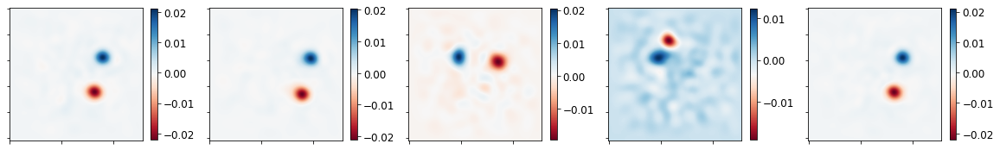

Loss: 


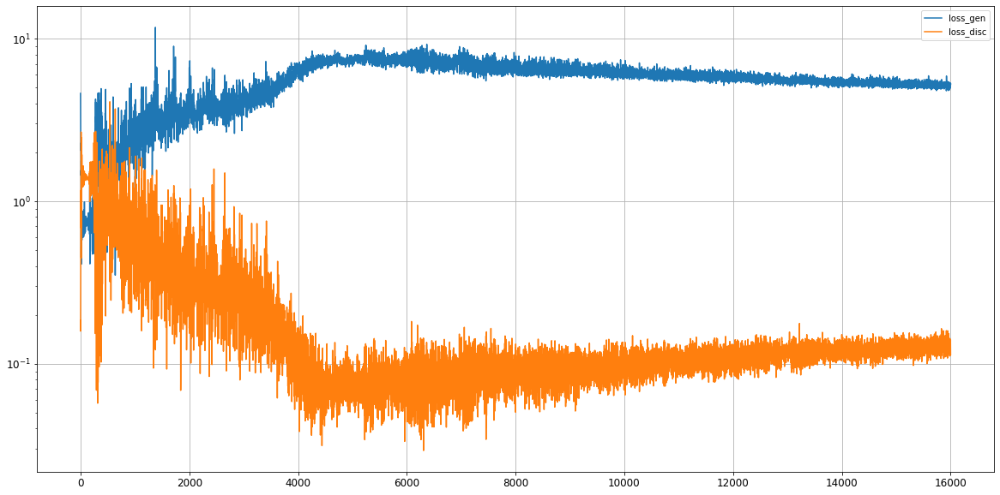

Epoch 16002/50000
discriminator loss:  0.119823 - generator loss:  5.063177 - 3s
Epoch 16003/50000
discriminator loss:  0.137321 - generator loss:  4.967041 - 3s
Epoch 16004/50000
discriminator loss:  0.159451 - generator loss:  4.926006 - 3s
Epoch 16005/50000
discriminator loss:  0.149900 - generator loss:  4.943519 - 3s
Epoch 16006/50000
discriminator loss:  0.126006 - generator loss:  5.329193 - 3s
Epoch 16007/50000
discriminator loss:  0.104559 - generator loss:  5.672919 - 3s
Epoch 16008/50000
discriminator loss:  0.121084 - generator loss:  5.415883 - 3s
Epoch 16009/50000
discriminator loss:  0.149120 - generator loss:  4.858839 - 3s
Epoch 16010/50000
discriminator loss:  0.154234 - generator loss:  4.818525 - 3s
Epoch 16011/50000
discriminator loss:  0.124325 - generator loss:  5.185427 - 3s
Epoch 16012/50000
discriminator loss:  0.125120 - generator loss:  5.207456 - 3s
Epoch 16013/50000
discriminator loss:  0.123368 - generator loss:  5.150638 - 3s
Epoch 16014/50000
discrimina

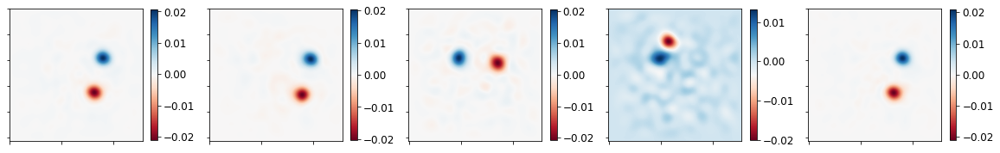

Loss: 


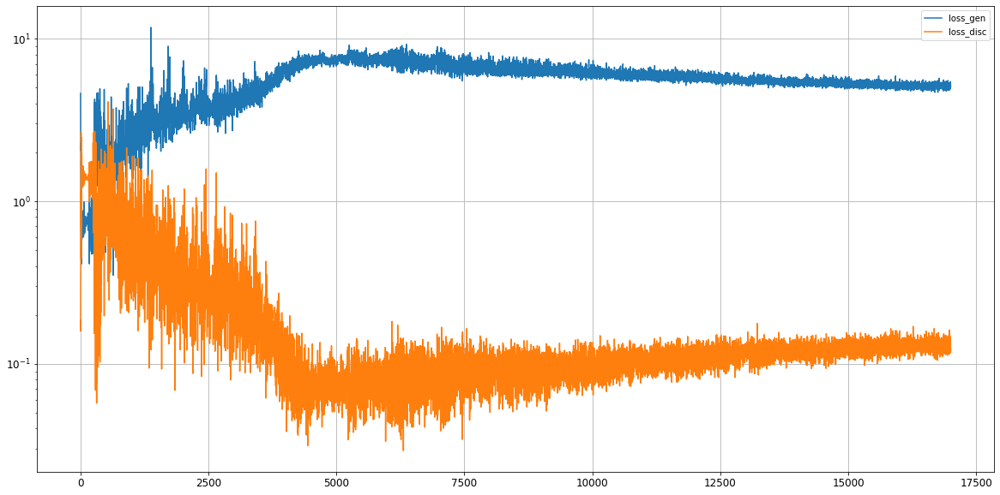

Epoch 17002/50000
discriminator loss:  0.146126 - generator loss:  4.837898 - 3s
Epoch 17003/50000
discriminator loss:  0.137222 - generator loss:  4.878633 - 3s
Epoch 17004/50000
discriminator loss:  0.136542 - generator loss:  5.239929 - 3s
Epoch 17005/50000
discriminator loss:  0.120025 - generator loss:  5.252922 - 3s
Epoch 17006/50000
discriminator loss:  0.114021 - generator loss:  5.084928 - 3s
Epoch 17007/50000
discriminator loss:  0.144456 - generator loss:  5.055363 - 3s
Epoch 17008/50000
discriminator loss:  0.153423 - generator loss:  4.903650 - 3s
Epoch 17009/50000
discriminator loss:  0.140933 - generator loss:  4.992898 - 3s
Epoch 17010/50000
discriminator loss:  0.120204 - generator loss:  5.468627 - 3s
Epoch 17011/50000
discriminator loss:  0.133085 - generator loss:  5.148922 - 3s
Epoch 17012/50000
discriminator loss:  0.135602 - generator loss:  4.958887 - 3s
Epoch 17013/50000
discriminator loss:  0.125932 - generator loss:  4.935080 - 3s
Epoch 17014/50000
discrimina

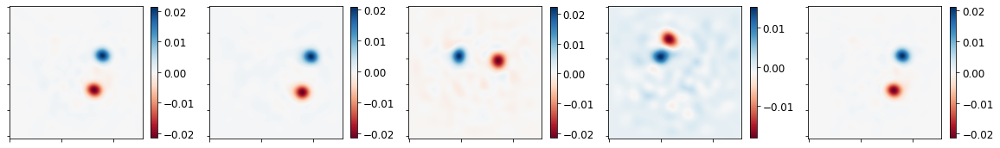

Loss: 


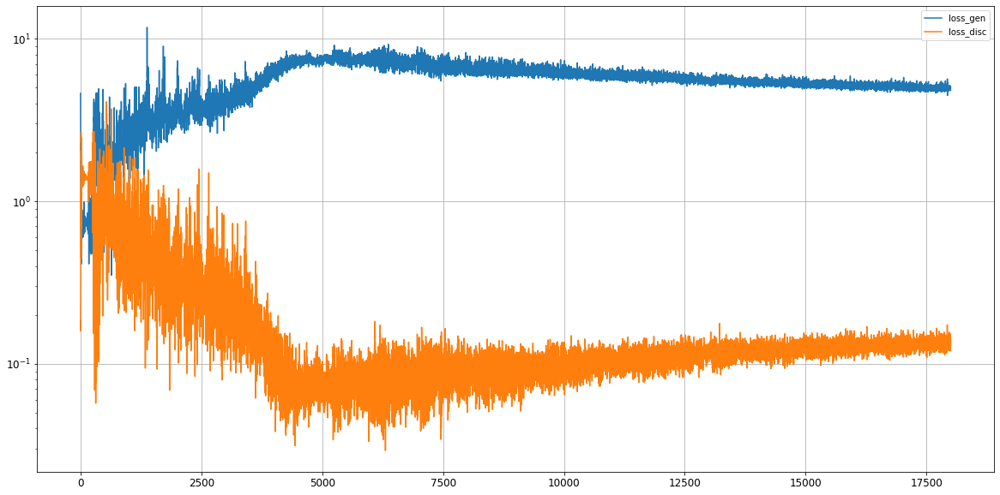

Epoch 18002/50000
discriminator loss:  0.117240 - generator loss:  5.155544 - 3s
Epoch 18003/50000
discriminator loss:  0.133079 - generator loss:  4.877867 - 3s
Epoch 18004/50000
discriminator loss:  0.121921 - generator loss:  4.836289 - 3s
Epoch 18005/50000
discriminator loss:  0.121819 - generator loss:  4.864116 - 3s
Epoch 18006/50000
discriminator loss:  0.130489 - generator loss:  4.934710 - 3s
Epoch 18007/50000
discriminator loss:  0.139045 - generator loss:  4.858114 - 3s
Epoch 18008/50000
discriminator loss:  0.144080 - generator loss:  5.102983 - 3s
Epoch 18009/50000
discriminator loss:  0.136501 - generator loss:  5.275908 - 3s
Epoch 18010/50000
discriminator loss:  0.120985 - generator loss:  5.119938 - 3s
Epoch 18011/50000
discriminator loss:  0.130622 - generator loss:  4.927677 - 3s
Epoch 18012/50000
discriminator loss:  0.132694 - generator loss:  5.031559 - 3s
Epoch 18013/50000
discriminator loss:  0.142208 - generator loss:  4.823819 - 3s
Epoch 18014/50000
discrimina

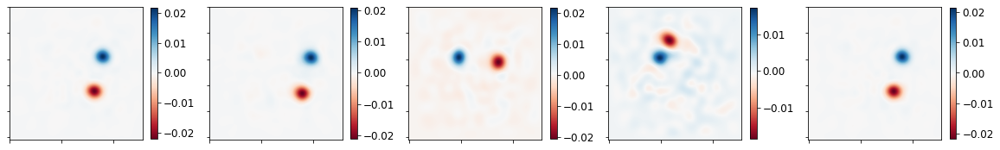

Loss: 


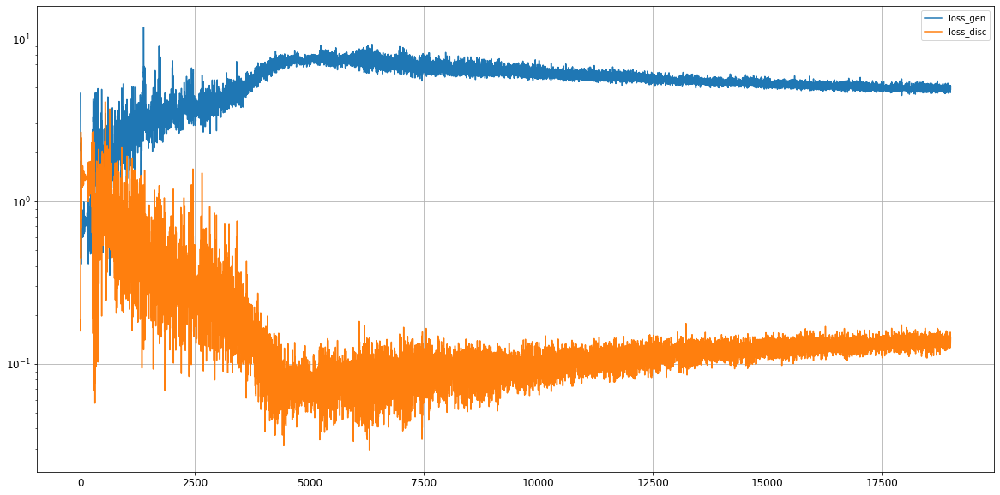

Epoch 19002/50000
discriminator loss:  0.125239 - generator loss:  4.891656 - 3s
Epoch 19003/50000
discriminator loss:  0.144090 - generator loss:  4.866766 - 3s
Epoch 19004/50000
discriminator loss:  0.143192 - generator loss:  4.872814 - 3s
Epoch 19005/50000
discriminator loss:  0.140783 - generator loss:  4.898735 - 3s
Epoch 19006/50000
discriminator loss:  0.131721 - generator loss:  4.960988 - 3s
Epoch 19007/50000
discriminator loss:  0.129411 - generator loss:  4.979048 - 3s
Epoch 19008/50000
discriminator loss:  0.145150 - generator loss:  4.785044 - 3s
Epoch 19009/50000
discriminator loss:  0.133092 - generator loss:  4.871828 - 3s
Epoch 19010/50000
discriminator loss:  0.130895 - generator loss:  4.978673 - 3s
Epoch 19011/50000
discriminator loss:  0.133204 - generator loss:  4.926082 - 3s
Epoch 19012/50000
discriminator loss:  0.136945 - generator loss:  4.954230 - 3s
Epoch 19013/50000
discriminator loss:  0.136990 - generator loss:  4.970141 - 3s
Epoch 19014/50000
discrimina

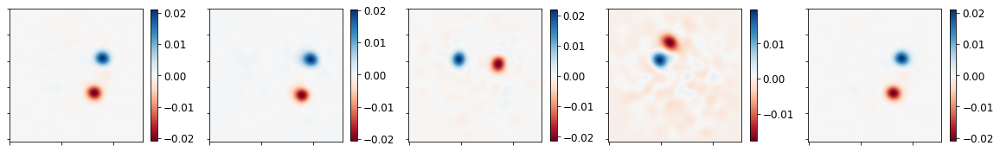

Loss: 


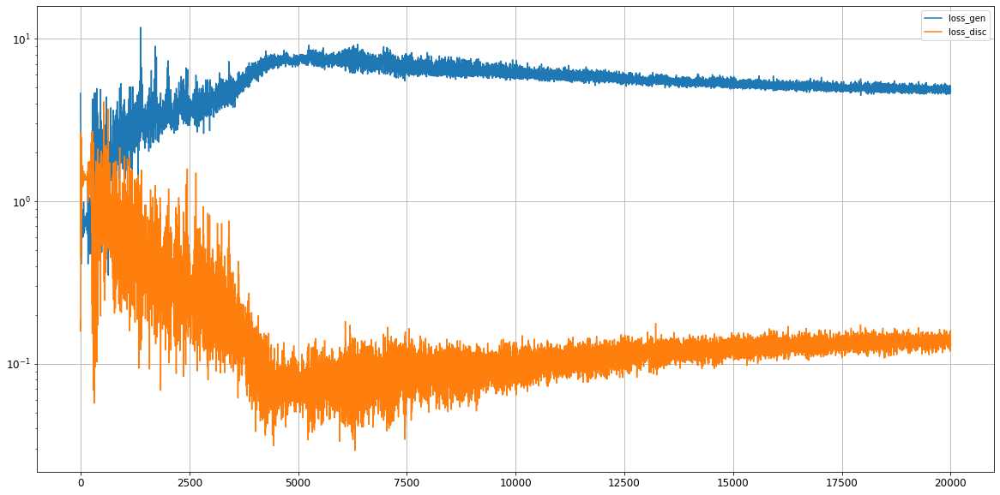

Epoch 20002/50000
discriminator loss:  0.131703 - generator loss:  4.824333 - 3s
Epoch 20003/50000
discriminator loss:  0.132902 - generator loss:  4.824605 - 3s
Epoch 20004/50000
discriminator loss:  0.123006 - generator loss:  5.009377 - 3s
Epoch 20005/50000
discriminator loss:  0.133585 - generator loss:  4.789269 - 3s
Epoch 20006/50000
discriminator loss:  0.147358 - generator loss:  4.797071 - 3s
Epoch 20007/50000
discriminator loss:  0.147867 - generator loss:  4.814195 - 3s
Epoch 20008/50000
discriminator loss:  0.128751 - generator loss:  4.857754 - 3s
Epoch 20009/50000
discriminator loss:  0.128687 - generator loss:  5.053244 - 3s
Epoch 20010/50000
discriminator loss:  0.147168 - generator loss:  4.676342 - 3s
Epoch 20011/50000
discriminator loss:  0.134982 - generator loss:  4.808143 - 3s
Epoch 20012/50000
discriminator loss:  0.132797 - generator loss:  5.042498 - 3s
Epoch 20013/50000
discriminator loss:  0.149396 - generator loss:  5.039682 - 3s
Epoch 20014/50000
discrimina

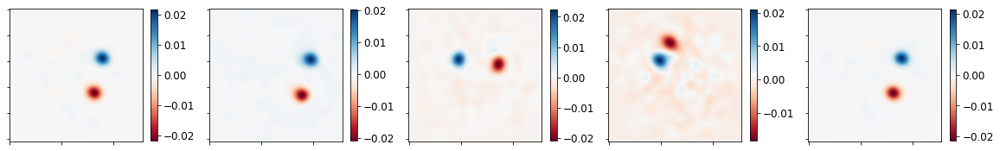

Loss: 


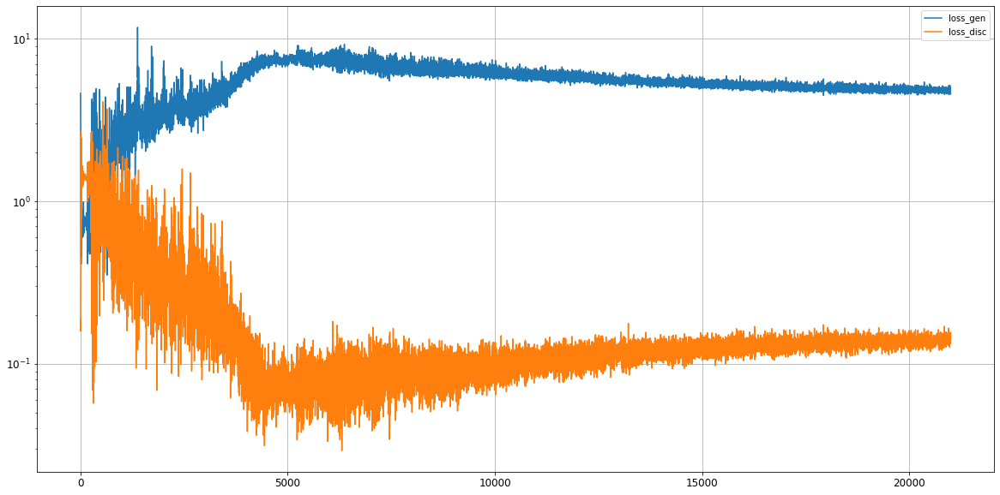

Epoch 21002/50000
discriminator loss:  0.140153 - generator loss:  4.577230 - 3s
Epoch 21003/50000
discriminator loss:  0.144247 - generator loss:  5.090991 - 3s
Epoch 21004/50000
discriminator loss:  0.140181 - generator loss:  5.043125 - 3s
Epoch 21005/50000
discriminator loss:  0.149547 - generator loss:  4.694632 - 3s
Epoch 21006/50000
discriminator loss:  0.152444 - generator loss:  4.865642 - 3s
Epoch 21007/50000
discriminator loss:  0.133581 - generator loss:  5.025583 - 3s
Epoch 21008/50000
discriminator loss:  0.136898 - generator loss:  4.719481 - 3s
Epoch 21009/50000
discriminator loss:  0.135450 - generator loss:  4.617547 - 3s
Epoch 21010/50000
discriminator loss:  0.134698 - generator loss:  4.637374 - 3s
Epoch 21011/50000
discriminator loss:  0.133865 - generator loss:  4.743483 - 3s
Epoch 21012/50000
discriminator loss:  0.135140 - generator loss:  4.906525 - 3s
Epoch 21013/50000
discriminator loss:  0.143685 - generator loss:  4.833798 - 3s
Epoch 21014/50000
discrimina

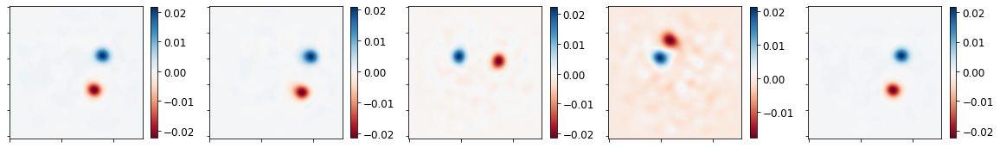

Loss: 


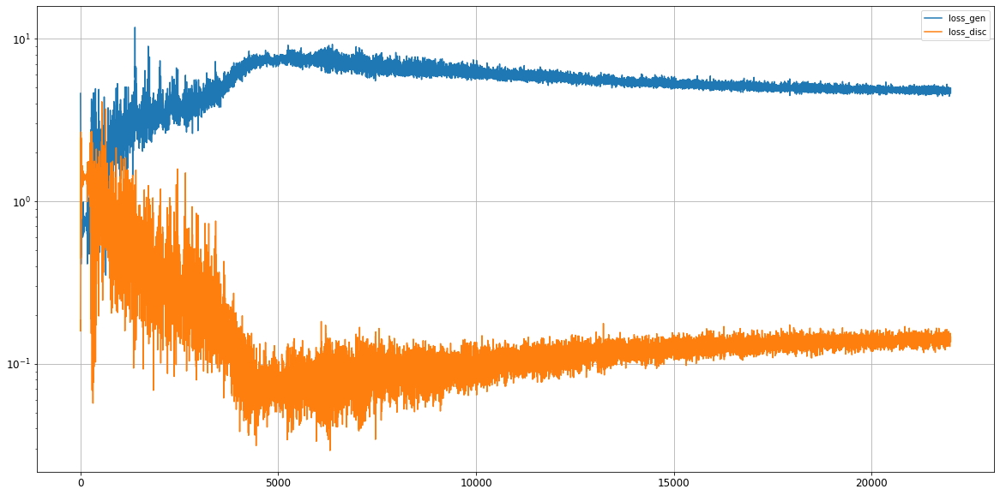

Epoch 22002/50000


In [ ]:
import time
hist = train(train_dataset, epochs=50000)

# Time Prediction with GAN